In [ ]:
# -*- coding: utf-8 -*-
"""
This is a workflow intended to expedite the plotting of flow properties from CenCOOS 2km HF Radar Data
Optimized to run on Eady (eady.caltech.edu)

Please utilize the Dask distributed Client scheduler for best results
Last Updatedd 06/18/2020 Thursday

"""
from IPython.core.display import display, HTML # Widen jupyter notebook
display(HTML("<style>.container { width:100% !important; }</style>"))

In [1]:
# Setup Distributed Client
autostart = True
if autostart:
    pass # just let it use the dask lab extension cluster
else:
    from dask.diagnostics import ProgressBar
    from dask.distributed import Client
    from dask.distributed import LocalCluster
    # client = Client('localhost:8787') # Connect to old dashboard?
    try:
        client = Client('tcp://localhost:8786', timeout='2s')
    except OSError:
        cluster = LocalCluster(scheduler_port=8786)
        client = Client(cluster)
client

Client Scheduler: tcp://127.0.0.1:46636 Dashboard: http://127.0.0.1:8787/status,Cluster Workers: 6 Cores: 24 Memory: 134.93 GB


In [2]:
#%% Setup Packages
import xarray as xr
from xarray import open_mfdataset
import dask
import dask.array as da
import netCDF4 as netcdf
import numpy as np
import numpy.ma as ma

import pandas as pd
import datetime
import matplotlib.pyplot as plt
from matplotlib import animation, rcParams, cycler
from matplotlib.animation import FuncAnimation
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
import cartopy
import cartopy.crs as ccrs
import metpy.calc as mpcalc
from metpy.units import units
import itertools
import scipy.spatial
import sklearn.metrics
from fractions import Fraction
import matplotlib.dates as mdates
from matplotlib.ticker import FuncFormatter
from scipy.signal import argrelextrema
import dateutil
import warnings


import sys
import os
from importlib import reload

sys.path.insert(1,r"/export/home1/jbenjami/Research_Thompson/Python/personal/")
print(sys.path)
import personal

import personal.math as pm
import personal.data_structures
import personal.date_operations
import personal.SMODE
import personal.calculations
import personal.geometry
import personal.system
import personal.plots
import personal.IO
import personal.constants
import gc; gc.collect()

a                = personal.constants.earth['radius']
seasons          = {'DJF':[12, 1, 2],'JFM':[ 1, 2, 3],'FMA':[ 2, 3, 4],
                    'MAM':[ 3, 4, 5],'AMJ':[ 4, 5, 6],'MJJ':[ 5, 6, 7],
                    'JJA':[ 6, 7, 8],'JAS':[ 7, 8, 9],'ASO':[ 8, 9,10],
                    'SON':[ 9,10,11],'OND':[10,11,12],'NDJ':[11,12, 1]}

file_path        = os.path.abspath(os.path.dirname(''))
data_relpath     = "../Data/HF_Radar/2km/processed/smode_region/"
output_savepath  = "../Data/HF_Radar/2km/processed/smode_region/miscellaneous/"
data_source      = os.path.normpath(os.path.join(file_path, data_relpath))

# metadata         = xr.open_mfdataset(os.path.normpath(os.path.join(file_path, output_savepath)) + '/HFRADAR_SMODE_Region_2km_Resolution_Hourly_Metadata.nc', decode_cf=True, decode_times=True,combine='by_coords',data_vars="minimal", coords="minimal", compat="override")

#%% Plot setup
dpi = 100
from matplotlib.axes import Axes
from cartopy.mpl.geoaxes import GeoAxes
GeoAxes._pcolormesh_patched = Axes.pcolormesh

['/export/home1/jbenjami/Research_Thompson/Python', '/export/home1/jbenjami/Research_Thompson/Python/personal/', '/export/home1/jbenjami/anaconda3/lib/python37.zip', '/export/home1/jbenjami/anaconda3/lib/python3.7', '/export/home1/jbenjami/anaconda3/lib/python3.7/lib-dynload', '', '/export/home1/jbenjami/.local/lib/python3.7/site-packages', '/export/home1/jbenjami/anaconda3/lib/python3.7/site-packages', '/export/home1/jbenjami/anaconda3/lib/python3.7/site-packages/IPython/extensions', '/export/home1/jbenjami/.ipython']


In [3]:
#Load data, pure velocity Not needed bc we can just use baseline="" from the primed velocities u_p, v_p
kinetic_energy              = xr.open_mfdataset(data_source+'/kinetic_energy/*.nc*'          , decode_cf=True, decode_times=True,combine='by_coords',data_vars="minimal", coords="minimal", compat="override",parallel=True) # chunked this way for speed, since we are now just saving calcs to disk... decoding times seems to work, dask chunks for speed
kinetic_energy              = personal.data_structures.assign_x_y_to_lat_lon_dataset(kinetic_energy, {'t':0,'y':1,'x':2})
kinetic_energy_smoothed     = xr.open_mfdataset(data_source+'/smoothed//kinetic_energy/*.nc*', decode_cf=True, decode_times=True,combine='by_coords',data_vars="minimal", coords="minimal", compat="override",parallel=True) # chunked this way for speed, since we are now just saving calcs to disk... decoding times seems to work, dask chunks for speed
kinetic_energy_smoothed     = personal.data_structures.assign_x_y_to_lat_lon_dataset(kinetic_energy_smoothed, {'t':0,'y':1,'x':2})

lat, lon, latg, long, time  = kinetic_energy['lat'], kinetic_energy['lon'], kinetic_energy['latg'], kinetic_energy['long'], kinetic_energy['time']
coords                      = np.float32(np.stack((latg.values.flatten(), long.values.flatten()),axis=1)) # check order (x,y matches lon,lat)

seas_groups                 = {seas:time.dt.month.isin(months) for seas,months in seasons.items()}
mn_groups                   = {month:time.dt.month.isin(month) for month in np.unique(time.dt.month)}
t_str =  time.dt.strftime("%Y-%m")
yrmn_groups                 = {x: t_str.isin(x) for x in np.unique(t_str)}

In [13]:
# precomputed (deprecated in favor of random subset selections -- won't work for random points)
speed_precomputed = personal.SMODE.process_for_structure_fcn(velocity['speed'],
                                                             precomputed        = {},
                                                             save_variables     = { 'data', 'mask','distances','distance_bins', 'distance_bin_ranges','bin_mapping','coords'}, # save items in this dictionary to given filenames
                                                             save_filepath      = os.path.normpath(os.path.join(file_path, output_savepath)) + '/' + 'smode_speed_sf_setup.pkl'
                                                             )

KE_precomputed    = personal.SMODE.process_for_structure_fcn(velocity['KE'],
                                                             precomputed        = {},
                                                             save_variables     = { 'data', 'mask','distances','distance_bins', 'distance_bin_ranges','bin_mapping','coords'}, # save items in this dictionary to given filenames
                                                             save_filepath      = os.path.normpath(os.path.join(file_path, output_savepath)) + '/' + 'smode_KE_sf_setup.pkl'
                                                             )

In [547]:
_data = kinetic_energy[['u_p','v_p']].sel(baseline="") 
_data = _data.isel(time = np.sort(np.random.choice(np.where(np.arange(len(_data.time)))[0],size=40000,replace=False))).compute()

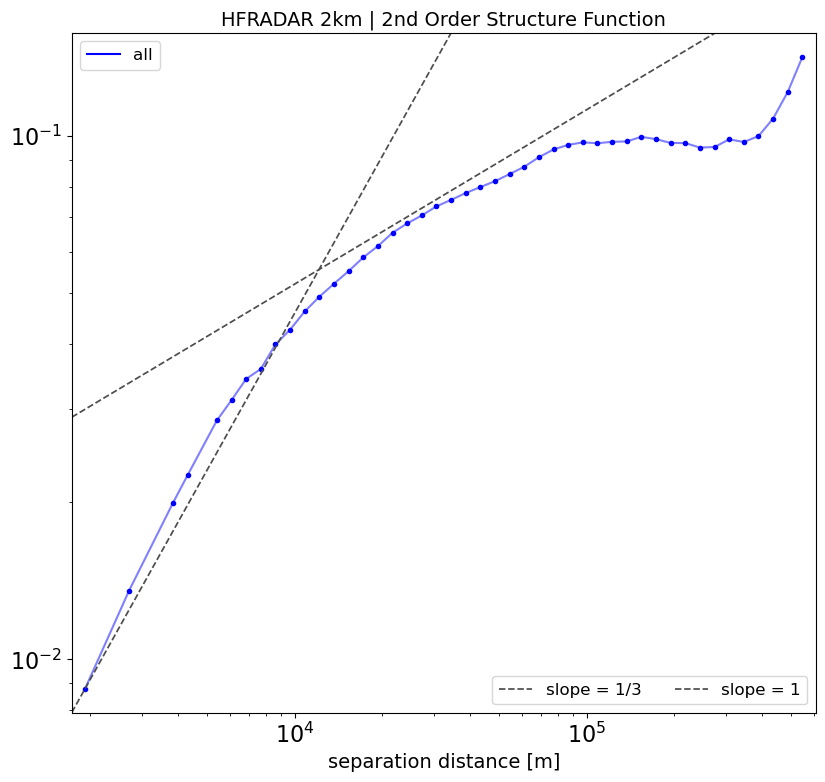

In [554]:
# KE baseline none | 2nd order
_name          = 'HFRADAR_2KM_velocity_2nd_order_sf'
_save_filepath = os.path.normpath(os.path.join(file_path, output_savepath)) + '/' + _name + '.pkl'
recalc = False
# _data = kinetic_energy[['u_p','v_p']].sel(baseline="")
# _data = _data.isel(time = np.sort(np.random.choice(np.where(np.arange(len(_data.time)))[0],size=40000,replace=False))).compute()
if recalc:
    KE_sf                       = personal.SMODE.calculate_structure_fcn(
        data                    = _data,
        precomputed             = {},
        save_variables          = { 'structure_fcn','distance_bins', 'distance_bin_ranges'}, # save items in this dictionary to given filenames
        save_filepath           = _save_filepath,
        file_path               = os.path.abspath(os.path.dirname('')),
        data_relpath            = "../Data/HF_Radar/2km/processed/smode_region/",
        output_savepath         = "..//Data/HF_Radar/2km/processed/smode_region/miscellaneous/",
        random_subset_size      = 5000,
        time_groups             = {'all':slice(0,None,None)}, # how to group the time, can be a list of logical arrays
        nbins                   = 50,
        method_or_order         = '2nd',
        parallelize             = True,
        parallel_args           = {'n_jobs':20, 'require':'sharedmem'},
        ch_size_fcn             = lambda x: 3000,
        load_after_masking      = False,
        load_at_runtime         = False); _ = gc.collect()
_ = personal.calculations.plot_sturucture_function(personal.IO.pickle_load(_save_filepath)['structure_fcn'], title='HFRADAR 2km | 2nd Order Structure Function', style='normal', slopes=[1,(Fraction(1/3), .1)], 
                                                   leg2_args={'loc':'lower right','ncol':6,'fontsize':12,'facecolor':'white'}, save_path = os.path.normpath(os.path.join(file_path, "../Figures/Structure_Function/"))  + '/' + _name + '.pdf')

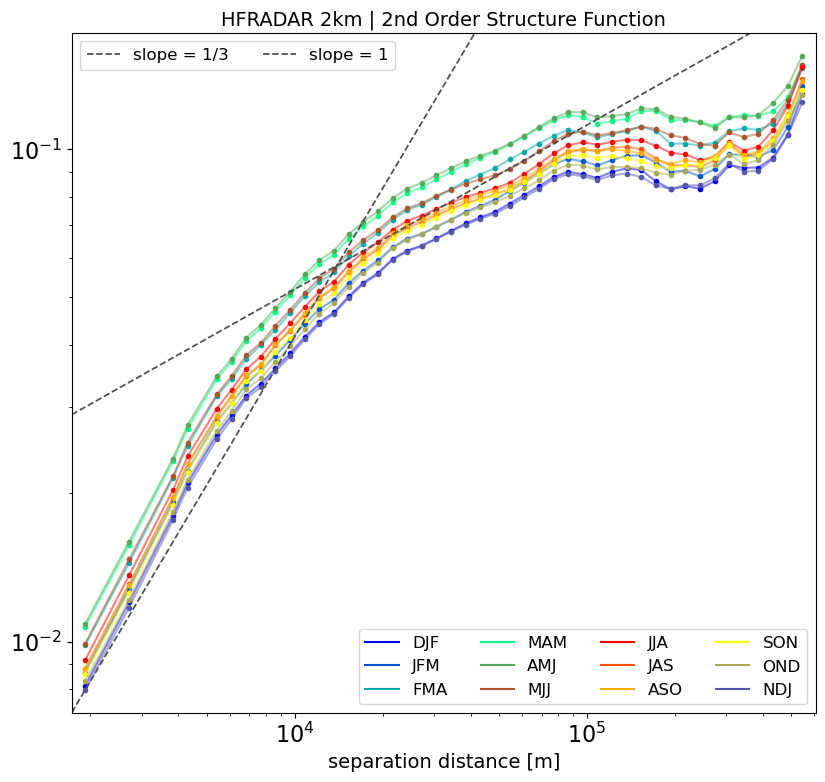

In [555]:
# KE baseline none, reolling seasons | 2nd order
_name = 'HFRADAR_2KM_velocity_rolling_seas_2nd_order_sf'
_save_filepath = os.path.normpath(os.path.join(file_path, output_savepath)) + '/' + _name + '.pkl'
recalc=False
# _data = kinetic_energy[['u_p','v_p']].sel(baseline="") 
# _data = _data.isel(time = np.sort(np.random.choice(np.where(np.arange(len(_data.time)))[0],size=5000,replace=False))).compute()
if recalc:
    _seas_groups = {seas:_data.time.dt.month.isin(months) for seas,months in seasons.items()}
    KE_rolling_seas_sf          = personal.SMODE.calculate_structure_fcn(
        data                    = _data,
        precomputed             = {},
        save_variables          = { 'structure_fcn','distance_bins', 'distance_bin_ranges'}, # save items in this dictionary to given filenames
        save_filepath           = _save_filepath,
        file_path               = os.path.abspath(os.path.dirname('')),
        data_relpath            = "../Data/HF_Radar/2km/processed/smode_region/",
        output_savepath         = "..//Data/HF_Radar/2km/processed/smode_region/miscellaneous/",
        random_subset_size      = 2500,
        time_groups             = _seas_groups, # how to group the time, can be a list of logical arrays
        nbins                   = 50,
        method_or_order         = '2nd',
        parallelize             = True,
        parallel_args           = {'n_jobs':20, 'require':'sharedmem'},
        ch_size_fcn             = lambda x: 5000,
        load_after_masking      = False,
        load_at_runtime         = False); _ = gc.collect()
_ = personal.calculations.plot_sturucture_function(personal.IO.pickle_load(_save_filepath)['structure_fcn'], title='HFRADAR 2km | 2nd Order Structure Function', style='normal', slopes=[1,(Fraction(1/3), .1)], 
                                                   leg2_args={'loc':'upper left','ncol':6,'fontsize':12,'facecolor':'white'}, save_path = os.path.normpath(os.path.join(file_path, "../Figures/Structure_Function/"))  + '/' + _name + '.pdf')

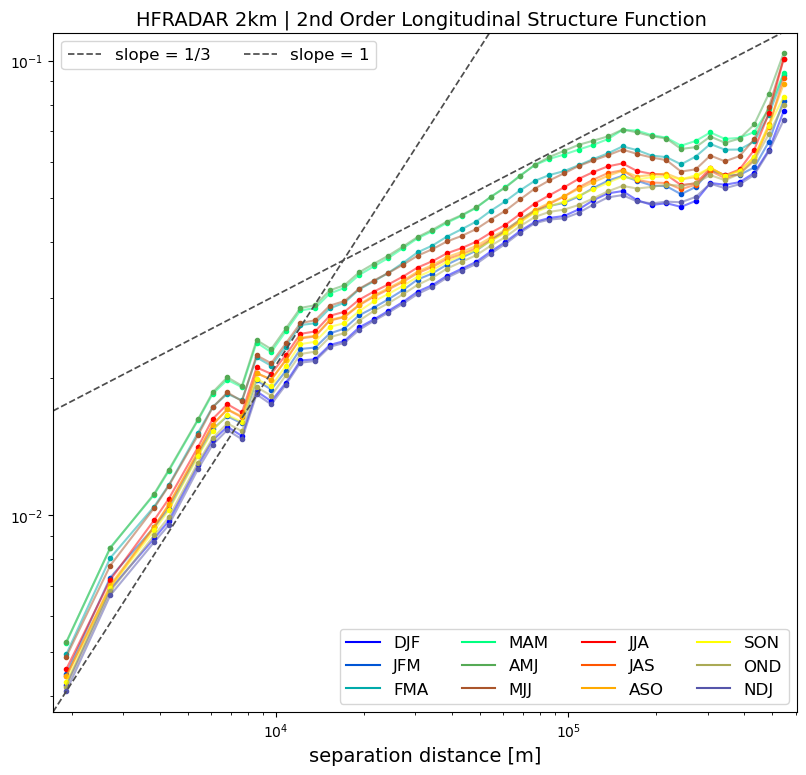

In [555]:
# KE baseline none, reolling seasons | 2nd order longitudeinal
_name = 'HFRADAR_2KM_velocity_rolling_seas_2nd_order_longitudinal_sf'
_save_filepath = os.path.normpath(os.path.join(file_path, output_savepath)) + '/' + _name + '.pkl'
recalc=True
# _data = kinetic_energy[['u_p','v_p']].sel(baseline="") 
# _data = _data.isel(time = np.sort(np.random.choice(np.where(np.arange(len(_data.time)))[0],size=5000,replace=False))).compute()
if recalc:
    _seas_groups = {seas:_data.time.dt.month.isin(months) for seas,months in seasons.items()}
    KE_rolling_seas_sf          = personal.SMODE.calculate_structure_fcn(
        data                    = _data,
        precomputed             = {},
        save_variables          = { 'structure_fcn','distance_bins', 'distance_bin_ranges'}, # save items in this dictionary to given filenames
        save_filepath           = _save_filepath,
        file_path               = os.path.abspath(os.path.dirname('')),
        data_relpath            = "../Data/HF_Radar/2km/processed/smode_region/",
        output_savepath         = "..//Data/HF_Radar/2km/processed/smode_region/miscellaneous/",
        random_subset_size      = 2500,
        time_groups             = _seas_groups, # how to group the time, can be a list of logical arrays
        nbins                   = 50,
        method_or_order         = '2nd longitudinal',
        parallelize             = True,
        parallel_args           = {'n_jobs':20, 'require':'sharedmem'},
        ch_size_fcn             = lambda x: 3000,
        load_after_masking      = False,
        load_at_runtime         = False); _ = gc.collect()
_ = personal.calculations.plot_sturucture_function(personal.IO.pickle_load(_save_filepath)['structure_fcn'], title='HFRADAR 2km | 2nd Order Longitudinal Structure Function ', style='normal', slopes=[1,(Fraction(1/3), .1)], 
                                                   leg2_args={'loc':'upper left','ncol':6,'fontsize':12,'facecolor':'white'}, save_path = os.path.normpath(os.path.join(file_path, "../Figures/Structure_Function/"))  + '/' + _name + '.pdf')

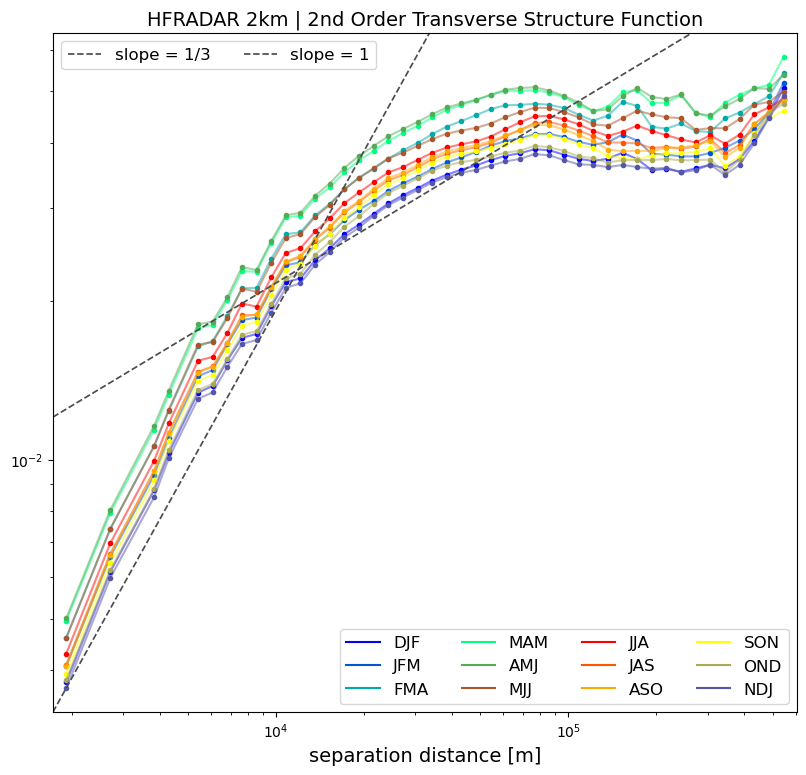

In [574]:
# KE baseline none, reolling seasons | 2nd order longitudeinal
_name = 'HFRADAR_2KM_velocity_rolling_seas_2nd_order_transverse_sf'
_save_filepath = os.path.normpath(os.path.join(file_path, output_savepath)) + '/' + _name + '.pkl'
recalc=False
# _data = kinetic_energy[['u_p','v_p']].sel(baseline="") 
# _data = _data.isel(time = np.sort(np.random.choice(np.where(np.arange(len(_data.time)))[0],size=20000,replace=False))).compute()
if recalc:
    _seas_groups = {seas:_data.time.dt.month.isin(months) for seas,months in seasons.items()}
    KE_rolling_seas_sf          = personal.SMODE.calculate_structure_fcn(
        data                    = _data,
        precomputed             = {},
        save_variables          = { 'structure_fcn','distance_bins', 'distance_bin_ranges'}, # save items in this dictionary to given filenames
        save_filepath           = _save_filepath,
        file_path               = os.path.abspath(os.path.dirname('')),
        data_relpath            = "../Data/HF_Radar/2km/processed/smode_region/",
        output_savepath         = "..//Data/HF_Radar/2km/processed/smode_region/miscellaneous/",
        random_subset_size      = 2500,
        time_groups             = _seas_groups, # how to group the time, can be a list of logical arrays
        nbins                   = 50,
        method_or_order         = '2nd transverse',
        parallelize             = True,
        parallel_args           = {'n_jobs':20, 'require':'sharedmem'},
        ch_size_fcn             = lambda x: 3000,
        load_after_masking      = False,
        load_at_runtime         = False); _ = gc.collect()
_ = personal.calculations.plot_sturucture_function(personal.IO.pickle_load(_save_filepath)['structure_fcn'], title='HFRADAR 2km | 2nd Order Transverse Structure Function', style='normal', slopes=[1,(Fraction(1/3), .1)], 
                                                   leg2_args={'loc':'upper left','ncol':6,'fontsize':12,'facecolor':'white'}, save_path = os.path.normpath(os.path.join(file_path, "../Figures/Structure_Function/"))  + '/' + _name + '.pdf')

In [21]:
# KE baseline none, by month
KE_monthly_sf               = personal.SMODE.calculate_structure_fcn(
    data                    = KE['KE'].sel(baseline=""),
    precomputed             = {},
    save_variables          = { 'structure_fcn','distance_bins', 'distance_bin_ranges'}, # save items in this dictionary to given filenames
    save_filepath           = os.path.normpath(os.path.join(file_path, output_savepath)) + '/' + 'HFRADAR_2KM_KE_monthly_sf.pkl',
    file_path               = os.path.abspath(os.path.dirname('')),
    data_relpath            = "../Data//HF_Radar/2km/processed/smode_region/",
    output_savepath         = "../Data//HF_Radar/2km/processed/smode_region/miscellaneous/",
    metadata                = KE['KE'],
    random_subset_size      = 5000,
    time_groups             = yrmn_groups, # how to group the time, can be a list of logical arrays
    nbins                   = 50,
    order                   = 2,
    fill_output_na          = False,
    vectorize               = True,
    parallelize             = True,
    parallel_args           = {'n_jobs':20, 'require':'sharedmem'},
    progress_bar            = True,
    ch_size_fcn             = lambda x: 12000,
    value_fcn_parallelize   = True,
    value_fcn_parallel_args = None,
    value_fcn_progress_bar  = True)
_ = gc.collect()

precomputing...
getting values from DataArray
Done
transposing
reshaping
calculating coordinates
taking data subset
calculating distances
binning
calculating structure function...
Processing: DJF
chunk size: 12000 for total length 12497500 -> 1042.0 chunks
{'n_jobs': 20}


parallelizing


/export/home1/jbenjami/Research_Thompson/Python/personal/calculations.py:194: RuntimeWarning: invalid value encountered in double_scalars
  struct_fun_info[dst_grp] = np.nansum(np.prod(dg,axis=1)) / np.sum(dg[:,1])



Processing: JFM
chunk size: 12000 for total length 12497500 -> 1042.0 chunks
{'n_jobs': 20}


parallelizing

Processing: FMA
chunk size: 12000 for total length 12497500 -> 1042.0 chunks
{'n_jobs': 20}


parallelizing

Processing: MAM
chunk size: 12000 for total length 12497500 -> 1042.0 chunks
{'n_jobs': 20}


parallelizing

Processing: AMJ
chunk size: 12000 for total length 12497500 -> 1042.0 chunks
{'n_jobs': 20}


parallelizing

Processing: MJJ
chunk size: 12000 for total length 12497500 -> 1042.0 chunks
{'n_jobs': 20}


parallelizing

Processing: JJA
chunk size: 12000 for total length 12497500 -> 1042.0 chunks
{'n_jobs': 20}


parallelizing

Processing: JAS
chunk size: 12000 for total length 12497500 -> 1042.0 chunks
{'n_jobs': 20}


parallelizing

Processing: ASO
chunk size: 12000 for total length 12497500 -> 1042.0 chunks
{'n_jobs': 20}


parallelizing

Processing: SON
chunk size: 12000 for total length 12497500 -> 1042.0 chunks
{'n_jobs': 20}


parallelizing

Processing: OND
chunk size: 12000 for total length 12497500 -> 1042.0 chunks
{'n_jobs': 20}


parallelizing

Processing: NDJ
chunk size: 12000 for total length 12497500 -> 1042.0 chunks
{'n_jobs': 20}


parallelizing

saving...


In [28]:
# KE baseline all
KE_sf_baseline_all          = personal.SMODE.calculate_structure_fcn(
    data                    = KE['KE'].sel(baseline="all"),
    precomputed             = {},
    save_variables          = { 'structure_fcn','distance_bins', 'distance_bin_ranges'}, # save items in this dictionary to given filenames
    save_filepath           = os.path.normpath(os.path.join(file_path, output_savepath)) + '/' + 'HFRADAR_2KM_KE_baseline_all_sf.pkl',
    file_path               = os.path.abspath(os.path.dirname('')),
    data_relpath            = "../Data/HF_Radar/2km/processed/smode_region/",
    output_savepath         = "..//Data/HF_Radar/2km/processed/smode_region/miscellaneous/",
    metadata                = KE,
    random_subset_size      = 5000,
    time_groups             = {'all':slice(0,None,None)}, # how to group the time, can be a list of logical arrays
    nbins                   = 50,
    order                   = 2,
    fill_output_na          = False,
    vectorize               = True,
    parallelize             = True,
    parallel_args           = {'n_jobs':20, 'require':'sharedmem'},
    progress_bar            = True,
    ch_size_fcn             = lambda x: 4000,
    value_fcn_parallelize   = True,
    value_fcn_parallel_args = None,
    value_fcn_progress_bar  = True )
_ = gc.collect()

precomputing...
getting values from DataArray
Done
transposing
reshaping
calculating coordinates
taking data subset
calculating distances
binning
calculating structure function...
Processing: all
chunk size: 4000 for total length 12497500 -> 3125.0 chunks
{'n_jobs': 20}


parallelizing


/export/home1/jbenjami/Research_Thompson/Python/personal/calculations.py:194: RuntimeWarning: invalid value encountered in double_scalars
  struct_fun_info[dst_grp] = np.nansum(np.prod(dg,axis=1)) / np.sum(dg[:,1])



saving...


In [66]:
# KE baseline all, rolling seasons
KE_baseline_all_rolling_seas_sf             = personal.SMODE.calculate_structure_fcn(
   data                    = KE['KE'].sel(baseline="all"),
   precomputed             = {},
   save_variables          = { 'structure_fcn','distance_bins', 'distance_bin_ranges'}, # save items in this dictionary to given filenames
   save_filepath           = os.path.normpath(os.path.join(file_path, output_savepath)) + '/' + 'HFRADAR_2KM_KE_baseline_all_rolling_seas_sf.pkl',
   file_path               = os.path.abspath(os.path.dirname('')),
   data_relpath            = "../Data/HF_Radar/2km/processed/smode_region/",
   output_savepath         = "../Data/HF_Radar/2km/processed/smode_region/miscellaneous/",
   metadata                = KE['KE'],
   random_subset_size      = 5000,
   time_groups             = seas_groups, # how to group the time, can be a list of logical arrays
   nbins                   = 50,
   order                   = 2,
   fill_output_na          = False,
   vectorize               = True,
   parallelize             = True,
   parallel_args           = {'n_jobs':20, 'require':'sharedmem'},
   progress_bar            = True,
   ch_size_fcn             = lambda x: 12000,
   value_fcn_parallelize   = True,
   value_fcn_parallel_args = None,
   value_fcn_progress_bar  = True)
_ = gc.collect()

In [1]:
# KE baseline all, by month
KE_baseline_all_monthly_sf               = personal.SMODE.calculate_structure_fcn(
    data                    = KE['KE'].sel(baseline="all"),
    precomputed             = {},
    save_variables          = { 'structure_fcn','distance_bins', 'distance_bin_ranges'}, # save items in this dictionary to given filenames
    save_filepath           = os.path.normpath(os.path.join(file_path, output_savepath)) + '/' + 'HFRADAR_2KM_KE_baseline_all_monthly_sf.pkl',
    file_path               = os.path.abspath(os.path.dirname('')),
    data_relpath            = "../Data//HF_Radar/2km/processed/smode_region/",
    output_savepath         = "../Data//HF_Radar/2km/processed/smode_region/miscellaneous/",
    metadata                = KE['KE'],
    random_subset_size      = 5000,
    time_groups             = yrmn_groups, # how to group the time, can be a list of logical arrays
    nbins                   = 50,
    order                   = 2,
    fill_output_na          = False,
    vectorize               = True,
    parallelize             = True,
    parallel_args           = {'n_jobs':20, 'require':'sharedmem'},
    progress_bar            = True,
    ch_size_fcn             = lambda x: 12000,
    value_fcn_parallelize   = True,
    value_fcn_parallel_args = None,
    value_fcn_progress_bar  = True)
_ = gc.collect()

NameError: name 'personal' is not defined

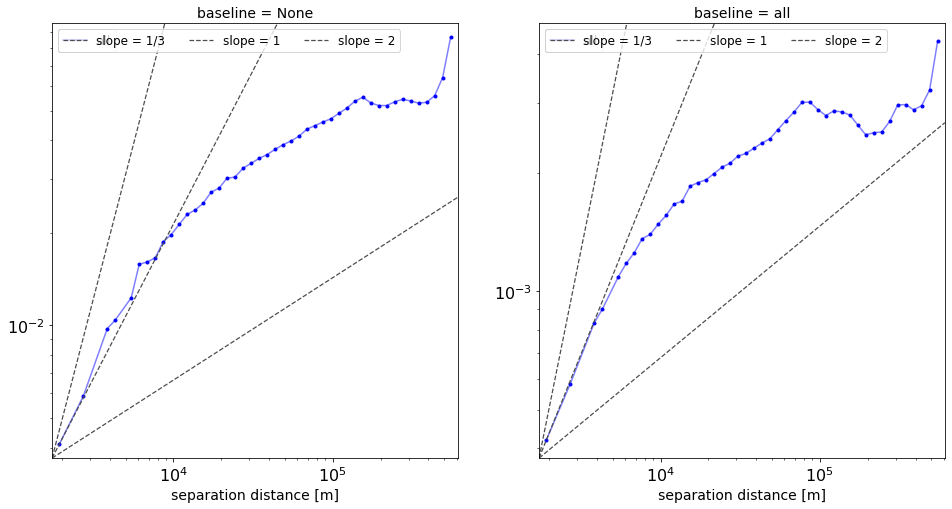

In [426]:
# Plot KE, baseline none
plt.rcParams.update({'font.size': 16}) # set font size
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16,8), facecolor='white') # height, length 
axes_list = axes.flatten()             # get a list of axes from the flattening the 2x2 grid to a 1x4 list
SF = [None]*2
SF[0] = personal.IO.pickle_load(os.path.normpath(os.path.join(file_path, output_savepath)) + '/' + 'HFRADAR_2KM_KE_sf.pkl')['structure_fcn']
SF[1] = personal.IO.pickle_load(os.path.normpath(os.path.join(file_path, output_savepath)) + '/' + 'HFRADAR_2KM_KE_baseline_all_sf.pkl')['structure_fcn']
titles = ['baseline = None','baseline = all']
for i,_ax in enumerate(axes_list):
#     n = SF[i]
    personal.calculations.plot_sturucture_function(SF[i], _ax=_ax, title=titles[i], style='normal',slopes=[2,1,Fraction(1,3)])



In [10]:
avg(4,5)

NameError: name 'avg' is not defined

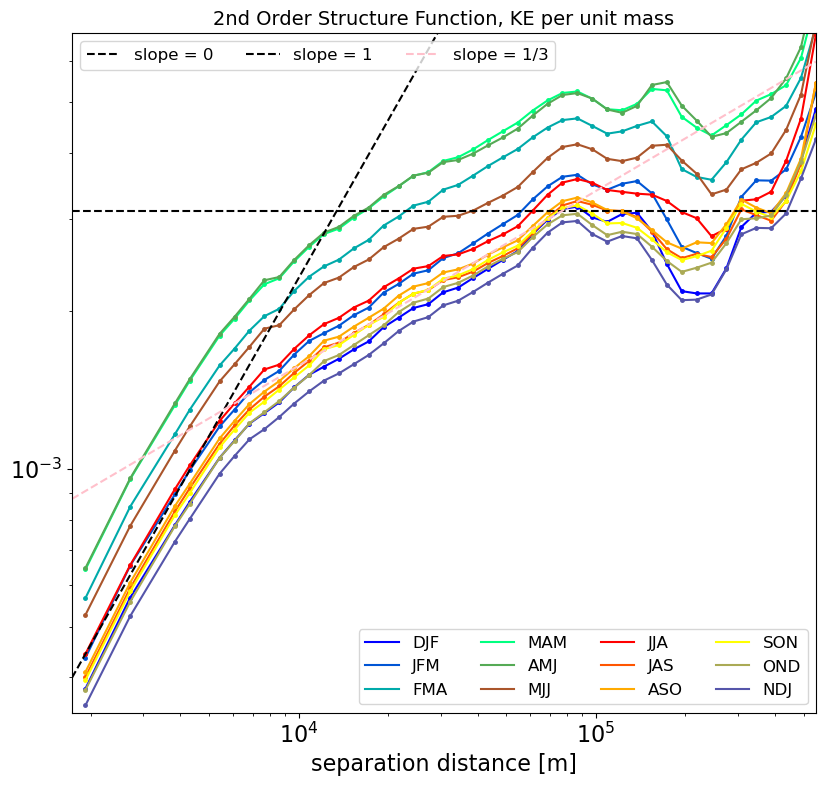

In [263]:
reload(personal.plots)
plt.rcParams.update({'font.size': 16}) # set font size
m_seas = personal.IO.pickle_load(os.path.normpath(os.path.join(file_path, output_savepath)) + '/' + 'HFRADAR_2KM_KE_rolling_seas_sf.pkl')['structure_fcn'] 
# m_seas = KE_sf_monthly_test['structure_fcn'] 

fig = personal.plots.default_figure(facecolor='white')
_ax  = plt.axes()
cmap = LinearSegmentedColormap.from_list("mycmap", [[0,0,1],[0,1,.5],[1,0,0],'yellow',[0,0,1]],N=13)
colors = cmap(np.linspace(0, 1, 13)[0:12])

for seas, color in zip(m_seas.keys(),colors):
#     m_seas[seas].fillna(method='ffill').plot(ax=_ax,logx=True,logy=True,label=seas,c=color,linestyle='--')
    m_seas[seas].dropna().plot(ax=_ax,logx=True,logy=True,label=seas,c=color)
#     m_seas[seas].plot(ax=_ax,logx=True,logy=True,label=seas,c=color)
    m_seas[seas].plot(ax=_ax,logx=True,logy=True,label='_nolegend_',c=color,style='.', markersize=5)

_ax.set_xlim(np.array([m_seas['DJF'].index[0] *0.9 ,m_seas['DJF'].index[-1]]))
_ax.set_ylim([np.nanmin(m_seas['DJF'].values[:-1])*0.9,np.nanmax(m_seas['DJF'].values[:-1]) ]*np.array([1,1.75]))
_ax.set_xlabel('separation distance [m]')
_ax.set_title('2nd Order Structure Function, KE per unit mass', fontsize=14)

personal.plots.axline(_ax,slope= 1, ax_scale='loglog',intercept=[m_seas['JJA'].index[  0],m_seas['JJA'].values[  0]],color='k',linestyle='--',label='slope = 1')
personal.plots.axline(_ax,slope= 0, ax_scale='loglog',intercept=[m_seas['JJA'].index[-20],m_seas['JJA'].values[-20]],color='k',linestyle='--',label='slope = 0')

slope = Fraction(1,3).limit_denominator(); personal.plots.axline(_ax,slope=float(slope),ax_scale='loglog',intercept=[m_seas['JJA'].index[-40],m_seas['JJA'].values[-40]],color='pink',linestyle='--',label='slope = ' + str(slope))

leg  = _ax.get_legend_handles_labels()
leg1 = _ax.legend(leg[0][ 0:12], leg[1][ 0:12], loc='lower right',ncol=4,fontsize=12)
_    = _ax.legend(leg[0][12:  ], leg[1][12:  ], loc='upper left' ,ncol=4,fontsize=12)
_    = _ax.add_artist(leg1)


fig.savefig('../Figures/Structure_Function/KE_3_Month_Seas_2nd_Order_SF.pdf')

In [27]:
reload(personal.math)
n = 5000 * 2 # want ~ 5000 points after filtering, assume ~ 1/2 are likely to be nan
L = round(n**(1./2))
ratios = np.array([len(KE['lat']), len(KE['lon'])])
ratios = ratios / np.prod(ratios)**(1./2)
Ls     = np.round(ratios*L).astype(int)
clustered_lats = KE['lat'][pm.random_with_clustering(nmax = len(KE.lat), L = Ls[0], mean_cluster_size=5,safety_counter_max=100)]
clustered_lons = KE['lon'][pm.random_with_clustering(nmax = len(KE.lon), L = Ls[1], mean_cluster_size=5,safety_counter_max=100)]

0.484375
0.4879518072289157


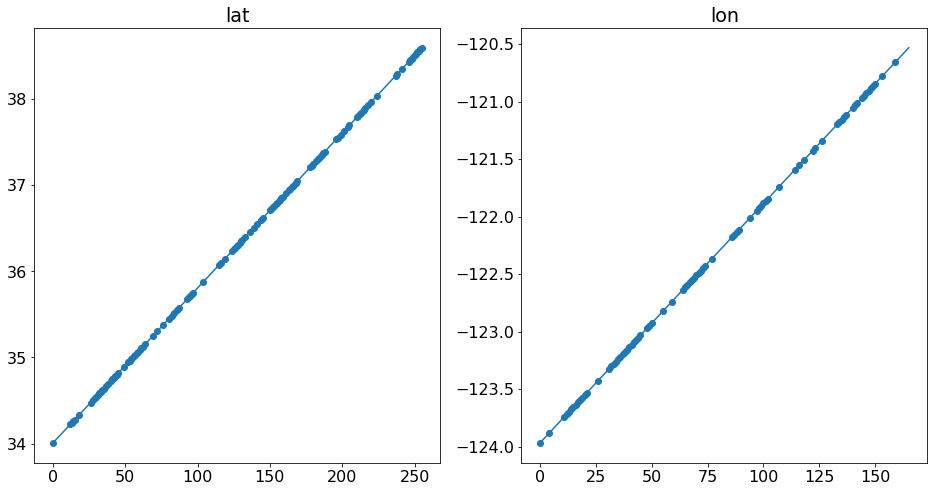

In [28]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16,8)) # height, length 
axes_list = axes.flatten() 
for i,coords in enumerate(zip([KE['lat'], KE['lon']], [clustered_lats, clustered_lons])):
    coord = coords[0]
    clustered_coord = coords[1]
    _ax = axes_list[i]
    _ax.plot(np.arange(len(coord)), coord)
    _ax.scatter(np.searchsorted(coord,clustered_coord), clustered_coord)
    _ax.set_title(coord.name)
    print(len(clustered_coord)/len(coord))

In [593]:
KE['KE'].sel(baseline="",lat=clustered_lats,lon=clustered_lons)

In [68]:
KE_test_data          =          KE['KE'].sel(baseline="all").isel(time=np.arange(30000,75000))
KE_test_data_smoothed = KE_smoothed['KE'].sel(baseline="all").isel(time=np.arange(30000,75000))
# KE_test_data.load()
KE_test_data_smoothed.load()

<xarray.DataArray 'KE' (time: 45000, lat: 256, lon: 166)>
array([[[       nan,        nan,        nan, ..., 0.02777054,
         0.02082979, 0.01572125],
        [       nan,        nan,        nan, ..., 0.02190375,
         0.02003293, 0.01598397],
        [       nan,        nan,        nan, ..., 0.01501061,
         0.01196267, 0.01156807],
        ...,
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan]],

       [[       nan,        nan,        nan, ..., 0.02915222,
         0.02268861, 0.01568336],
        [       nan,        nan,        nan, ..., 0.02417432,
         0.02246651, 0.01466716],
        [       nan,        nan,        nan, ..., 0.0160262 ,
         0.01328771, 0.0107533 ],
...
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan]],

       [[       nan,        nan,        nan, ..., 0.00380748,
         0.01411161, 0.01821734],
        [       nan,        nan,        nan, ..., 0.00287153,
         0.00926667, 0.01921729],
        [       nan,        nan,        nan, ..., 0.00787949,
         0.00912375, 0.0151814 ],
        ...,
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan]]], dtype=float32)
Coordinates:
  * lat       (lat) float32 34.00782 34.0258 34.04378 ... 38.57474 38.59272
  * lon       (lon) float32 -123.967705 -123.946884 ... -120.55293 -120.53211
  * time      (time) datetime64[ns] 2015-07-20T04:00:00 ... 2020-09-06T05:00:00
    time_run  (time) datetime64[ns] 2015-07-20T04:00:00 ... 2020-09-06T05:00:00
    baseline  <U3 'all'

In [208]:
# KE baseline none
reload(personal.SMODE)
KE_test             = personal.SMODE.calculate_structure_fcn(
#     data                    = KE['KE'].sel(baseline="",lat=clustered_lats,lon=clustered_lons),
#     data                    = KE['KE'].sel(baseline="all"),
    data                    = KE_test_data,
    precomputed             = {},
    save_variables          = { 'structure_fcn','distance_bins', 'distance_bin_ranges'}, # save items in this dictionary to given filenames
    save_filepath           = os.path.normpath(os.path.join(file_path, output_savepath)) + '/' + 'HFRADAR_2KM_KE_sf_test.pkl',
    file_path               = os.path.abspath(os.path.dirname('')),
    data_relpath            = "../Data/HF_Radar/2km/processed/smode_region/",
    output_savepath         = "..//Data/HF_Radar/2km/processed/smode_region/miscellaneous/",
    metadata                = KE,
    # random_subset_size      = None,
    random_subset_size      = 8000,
    time_groups             = {'all':slice(0,None,None)}, # how to group the time, can be a list of logical arrays
    nbins                   = 88,
    order                   = 2,
    fill_output_na          = False,
    vectorize               = True,
    parallelize             = True,
    parallel_args           = {'n_jobs':20, 'require':'sharedmem'},
    progress_bar            = True,
    ch_size_fcn             = lambda x: 10000,
    value_fcn_parallelize   = True,
    value_fcn_parallel_args = None,
    value_fcn_progress_bar  = True )
_ = gc.collect()

In [70]:
# KE baseline none
time_test             = KE_test_data['time']
time_groups_test      = {seas:time_test.dt.month.isin(months) for seas,months in seasons.items()}
KE_test_seas         = personal.SMODE.calculate_structure_fcn(
#     data                    = KE['KE'].sel(baseline="",lat=clustered_lats,lon=clustered_lons),
#     data                    = KE['KE'].sel(baseline="all"),
    data                    = KE_test_data_smoothed,
    precomputed             = {},
    save_variables          = { 'structure_fcn','distance_bins', 'distance_bin_ranges'}, # save items in this dictionary to given filenames
#     save_filepath           = os.path.normpath(os.path.join(file_path, output_savepath)) + '/' + 'HFRADAR_2KM_KE_sf_test_seas.pkl',
    file_path               = os.path.abspath(os.path.dirname('')),
    data_relpath            = "../Data/HF_Radar/2km/processed/smode_region/",
    output_savepath         = "..//Data/HF_Radar/2km/processed/smode_region/miscellaneous/",
    metadata                = KE,
    # random_subset_size      = None,
    random_subset_size      = 2000,
    time_groups             = time_groups_test, # how to group the time, can be a list of logical arrays
    nbins                   = 60,
    order                   = 2,
    fill_output_na          = False,
    vectorize               = True,
    parallelize             = True,
    parallel_args           = {'n_jobs':20, 'require':'sharedmem'},
    progress_bar            = True,
    ch_size_fcn             = lambda x: 6000,
    value_fcn_parallelize   = True,
    value_fcn_parallel_args = None,
    value_fcn_progress_bar  = True )
_ = gc.collect()

precomputing...
getting values from DataArray
Done
transposing
reshaping
calculating coordinates
data valid subset is of length:  10680
taking data subset of length 2000 from data (masked subset) of length 10680
calculating distances
binning
calculating structure function...
Processing: DJF
chunk size: 6000 for total length 1999000 -> 334.0 chunks
{'n_jobs': 20}


parallelizing

Processing: JFM
chunk size: 6000 for total length 1999000 -> 334.0 chunks
{'n_jobs': 20}


parallelizing

Processing: FMA
chunk size: 6000 for total length 1999000 -> 334.0 chunks
{'n_jobs': 20}


parallelizing

Processing: MAM
chunk size: 6000 for total length 1999000 -> 334.0 chunks
{'n_jobs': 20}


parallelizing

Processing: AMJ
chunk size: 6000 for total length 1999000 -> 334.0 chunks
{'n_jobs': 20}


parallelizing

Processing: MJJ
chunk size: 6000 for total length 1999000 -> 334.0 chunks
{'n_jobs': 20}


parallelizing

Processing: JJA
chunk size: 6000 for total length 1999000 -> 334.0 chunks
{'n_jobs': 20}


parallelizing

Processing: JAS
chunk size: 6000 for total length 1999000 -> 334.0 chunks
{'n_jobs': 20}


parallelizing

Processing: ASO
chunk size: 6000 for total length 1999000 -> 334.0 chunks
{'n_jobs': 20}


parallelizing

Processing: SON
chunk size: 6000 for total length 1999000 -> 334.0 chunks
{'n_jobs': 20}


parallelizing

Processing: OND
chunk size: 6000 for total length 1999000 -> 334.0 chunks
{'n_jobs': 20}


parallelizing

Processing: NDJ
chunk size: 6000 for total length 1999000 -> 334.0 chunks
{'n_jobs': 20}


parallelizing



In [9]:
KE_sf = personal.IO.pickle_load(os.path.normpath(os.path.join(file_path, output_savepath)) + '/' + 'HFRADAR_2KM_KE_sf_test.pkl')

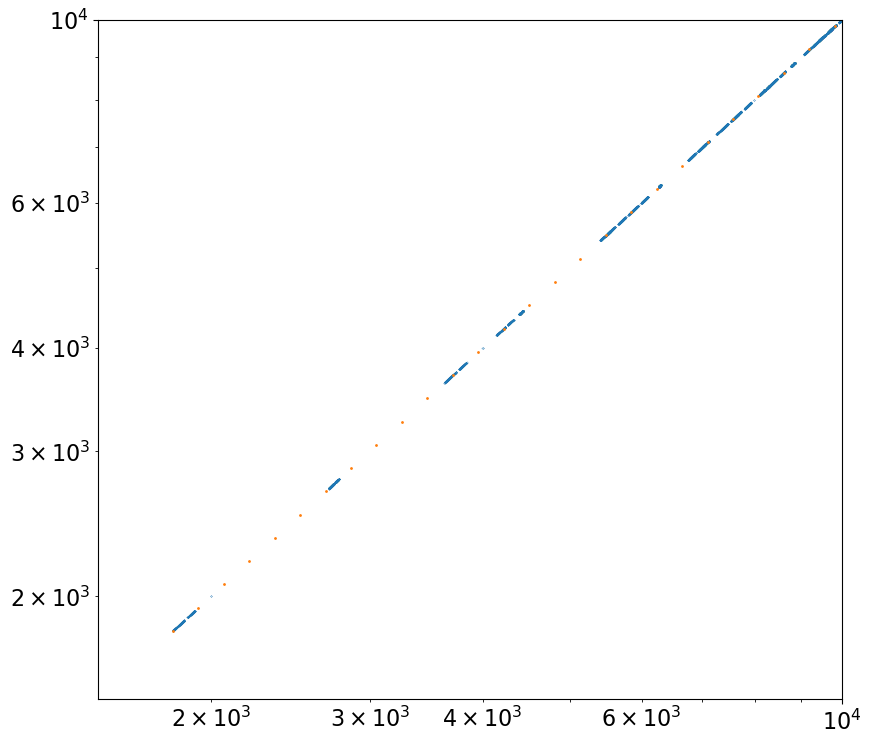

In [209]:
y = np.sort(np.unique(KE_test['distances']))
x = np.arange(len(y))
y2 = KE_test['distance_bins']
# y2 = np.geomspace(np.min(KE_test['distance_bins']),np.max(KE_test['distance_bins']),200)
x2 = np.arange(len(y2))
fig = personal.plots.default_figure(facecolor='white')

plt.scatter(y,y,.02)
plt.scatter(y2,y2,1)
lim = [1500, 10000]
plt.xlim(lim)
plt.ylim(lim)
plt.xscale('log')
plt.yscale('log')

In [65]:
n   = personal.IO.pickle_load(os.path.normpath(os.path.join(file_path, output_savepath)) + '/' + 'HFRADAR_2KM_KE_sf_test.pkl')['structure_fcn']['all']
fig = personal.plots.default_figure(facecolor='white')
_ax = n.dropna().plot(logx=True,logy=True,ylim=[np.nanmin(n.values[:-1]),np.nanmax(n.values[:-1]) ])
_ax = n.plot(logx=True,logy=True,ylim=[np.nanmin(n.values[:-1]),np.nanmax(n.values[:-1]) ],style='.')

_ax.set_xlim(np.array([n.index[0],n.index[-1]]))
personal.plots.axline(_ax,slope=3/3,ax_scale='loglog',intercept=[n.index[0],n.values[0]])
personal.plots.axline(_ax,slope=0,ax_scale='loglog',intercept=[n.index[-20],n.values[-20]])
_ax.set_xlim(np.array(_ax.get_xlim()) * [.5,2])
_ax.set_ylim(np.array(_ax.get_ylim()) * [.5,2])

# _ax.axline((n.index[0],n.iloc[0]),slope=1.5)
# line = personal.plots(_ax,1,n.iloc[1])

KeyError: 'all'

In [69]:
m_seas = personal.IO.pickle_load(os.path.normpath(os.path.join(file_path, output_savepath)) + '/' + 'HFRADAR_2KM_KE_sf_test_seas.pkl')['structure_fcn'] 
fig    = personal.plots.default_figure(facecolor='white')
_ax    = plt.axes()
cmap   = LinearSegmentedColormap.from_list("mycmap", [[0,0,1],[0,1,.5],[1,0,0],'yellow',[0,0,1]],N=13)
colors = cmap(np.linspace(0, 1, 13)[0:12])

for seas, color in zip(m_seas.keys(),colors):
    m_seas[seas].dropna().plot(ax=_ax,logx=True,logy=True,label=seas,c=color)
#     m_seas[seas].plot(ax=_ax,logx=True,logy=True,label=seas,c=color)
    m_seas[seas].plot(ax=_ax,logx=True,logy=True,label='_nolegend_',c=color,style='.', markersize=5)

_ax.set_xlim(np.array([m_seas['DJF'].index[0] *0.6 ,m_seas['DJF'].index[-1]]))
_ax.set_ylim([np.nanmin(m_seas['DJF'].values[:-1])*0.6,np.nanmax(m_seas['DJF'].values[:-1]) ]*np.array([1,1.75]))
_ax.set_xlabel('separation distance [m]')
_ax.set_title('2nd Order Structure Function, KE per unit mass', fontsize=14)

personal.plots.axline(_ax,slope= 1, ax_scale='loglog',intercept=[m_seas['JJA'].index[  0],m_seas['JJA'].values[  0]],color='k',linestyle='--',label='slope = 1')
personal.plots.axline(_ax,slope= 0, ax_scale='loglog',intercept=[m_seas['JJA'].index[-20],m_seas['JJA'].values[-20]],color='k',linestyle='--',label='slope = 0')

slope = Fraction(1,3).limit_denominator(); personal.plots.axline(_ax,slope=float(slope),ax_scale='loglog',intercept=[m_seas['JJA'].index[-40],m_seas['JJA'].values[-40]],color='pink',linestyle='--',label='slope = ' + str(slope))

leg  = _ax.get_legend_handles_labels()
leg1 = _ax.legend(leg[0][ 0:12], leg[1][ 0:12], loc='lower right',ncol=4,fontsize=12)
_    = _ax.legend(leg[0][12:  ], leg[1][12:  ], loc='upper left' ,ncol=4,fontsize=12)
_    = _ax.add_artist(leg1)

# _ax.axvline(3.9e3)
# _ax.axvline(7.4e3)

NameError: name 'KE_test_seas' is not defined

In [6]:
m_seas = personal.IO.pickle_load(os.path.normpath(os.path.join(file_path, output_savepath)) + '/' + 'HFRADAR_2KM_KE_sf_test_seas.pkl')['structure_fcn'] 
m_seas

In [518]:
# Plot seasonal cycles KE SF for various rs, in (here do baseline none)
warnings.filterwarnings('ignore');
n = 80
output_seas=m_seas
output_timegroups = list(output_seas.keys())
r = output_seas[output_timegroups[0]].index;
          
peak = 'largest'
if peak == 'earliest': max_ind,max_val = np.inf,-np.inf
if peak == 'largest' : max_ind,max_val = 0     ,-np.inf
for tg in output_timegroups[::+1]:
    _E = output_seas[tg].values
    if peak == 'largest':
        mxind = np.argmax(_E)
        mxval = _E[mxind]
        if mxval  > max_val: max_ind,max_val = mxind,mxval # largest peak
    if peak == 'earliest':
        mxind = argrelextrema(_E, np.greater)[0][0]
        mxval = _E[mxind]
        if mxind < max_ind: max_ind,max_val = mxind,mxval # earliest peak
#     print(max_val,max_ind)

rs                   = np.geomspace( r[max_ind], r[-1], n)
xt                   = np.array([np.datetime64(x) for x in dateutil.rrule.rrule(freq=dateutil.rrule.MONTHLY, count=13, dtstart=datetime.datetime(1, 1, 15))])
rs_nearest, rsn_inds = personal.data_structures.nearest(rs, r)
rsn_inds,valid       = np.unique(rsn_inds,return_index=True)
rs_nearest           = rs_nearest[valid]
seas_keys            = list(seasons.keys()); seas_keys.append(seas_keys[0]) # repeat end for plot continuity

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(32,16),facecolor='white') # prepare our 2x2 grid of subplots in side our figure
_ax1,_ax2 = axes

for _ax in axes:
    _ax.set_xlim(xmin=np.datetime64('0001-01-01'),xmax=np.datetime64('0002-02-01'))
    _ax.xaxis.set_major_locator(mdates.MonthLocator())
    _ax.xaxis.set_major_formatter( FuncFormatter(lambda x,pos: mdates.DateFormatter('%b')(x)[0] ))
    
lc = len(rsn_inds)+1
cmap_here   = LinearSegmentedColormap.from_list("mycmap", [[1,0,0],[0,0,1]],N=lc)
colors_here = cmap_here(np.linspace(0, 1, lc)[0:lc-1])
for i,ind in enumerate(rsn_inds[::-1]):
    E = np.array([output_seas[seas].values[ind] for seas in seas_keys])
    E[E<0] = np.nan
    _ax1.plot(xt,E,color = colors_here[i], label=f"{r[ind]:.2E}" )
    E_norm = sklearn.preprocessing.minmax_scale(E,feature_range=(0,1),copy=True)
    _ax2.plot(xt,E_norm,color = colors_here[i], label=f"{r[ind]:.2E}" )

_ax1.set_yscale('log')   ; _ax.set_ylim([2e-4, 1.0e-2]);
_ax2.set_yscale('linear');_ax2.set_ylim([0,1])
leg1,leg2 =  _ax1.legend(loc='upper center',ncol=8, bbox_to_anchor=(.5, -0.05)), _ax2.legend(loc='upper center',ncol=8, bbox_to_anchor=(.5, -0.05))

NameError: name 'm_seas' is not defined

In [17]:
data =  kinetic_energy[['u_p','v_p']].sel(baseline="")
data

<xarray.Dataset>
Dimensions:   (lat: 256, lon: 166, time: 75588)
Coordinates:
  * time      (time) datetime64[ns] 2012-01-01 ... 2020-09-30T17:00:00
    time_run  (time) datetime64[ns] dask.array<chunksize=(24,), meta=np.ndarray>
  * lat       (lat) float32 34.00782 34.0258 34.04378 ... 38.57474 38.59272
  * lon       (lon) float32 -123.967705 -123.946884 ... -120.55293 -120.53211
    baseline  <U1 ''
    latg      (lat, lon) float32 34.00782 34.00782 ... 38.59272 38.59272
    long      (lat, lon) float32 -123.967705 -123.946884 ... -120.53211
    x         (lat, lon) float64 0.0 1.919e+03 3.838e+03 ... 2.968e+05 2.986e+05
    y         (lat, lon) float64 0.0 0.0 0.0 ... 5.098e+05 5.098e+05 5.098e+05
Data variables:
    u_p       (time, lat, lon) float32 dask.array<chunksize=(24, 256, 166), meta=np.ndarray>
    v_p       (time, lat, lon) float32 dask.array<chunksize=(24, 256, 166), meta=np.ndarray>
Attributes:
    Conventions:               CF-1.4, ACDD-1.3
    id:                        202007072100siohfruwlsrtvuswc2km
    date_created:              2020-07-07T23:20:25Z
    source:                    surface ocean velocity field from hf-radar
    program:                   Integrated Ocean Observing System (IOOS)
    title:                     Near-Real Time Surface Ocean Velocity, U.S. We...
    summary:                   Surface ocean velocities estimated from HF-Rad...
    instrument:                Earth Remote Sensing Instruments, Active Remot...
    keywords:                  Earth Science, Oceans, Sea Surface, Coastal Pr...
    geospatial_lat_min:        30.25
    geospatial_lat_max:        49.99204
    geospatial_lon_min:        -130.36
    geospatial_lon_max:        -115.805565
    processing_level:          Near real-time dataset with automated data acq...
    history:                   2020-07-07T22:20:40Z hfrnet rtvMergeData: Savi...
    references:                Terrill, E. et al., 2006. Data Management and ...
    institution:               Coastal Observing Research and Development Cen...
    creator_type:              group
    creator_name:              HFRNet Administrators
    creator_email:             hfrnet.administrators@sio.ucsd.edu
    creator_url:               http://cordc.ucsd.edu/projects/mapping/
    naming_authority:          edu.ucsd.cordc
    standard_name_vocabulary:  CF Standard Name Table, Version 51
    keywords_vocabulary:       Global Change Master Directory (GCMD) Keywords...
    instrument_vocabulary:     Global Change Master Directory (GCMD) Keywords...
    format_version:            1.1.00
    product_version:           2.0.00
    _CoordSysBuilder:          ucar.nc2.dataset.conv.CF1Convention
    cdm_data_type:             GRID
    featureType:               GRID
    location:                  Proto fmrc:HFRADAR_US_West_Coast_2km_Resolutio...

In [64]:
reload(personal.SMODE)
# 3rd order diag SF seasonal... (pray)
# data =  kinetic_energy[['u_p','v_p']].sel(baseline="")
# data = data.isel(time = np.sort(np.random.choice(np.where(np.arange(len(data.time)))[0],size=5000,replace=False)))
# data = data.compute()
# _seas_groups                 = {seas:data.time.dt.month.isin(months) for seas,months in seasons.items()}

velocity_smoothed_rolling_seas_third_order_diagonal_sf = personal.SMODE.calculate_structure_fcn(
    data                    = data, #.to_array().transpose(*('time','variable',...)),
    precomputed             = {},
    save_variables          = { 'structure_fcn','distance_bins', 'distance_bin_ranges'}, # save items in this dictionary to given filenames
    save_filepath           = os.path.normpath(os.path.join(file_path, output_savepath)) + '/' + 'HFRADAR_2KM_velocity_smoothed_rolling_seas_third_order_diagonal_sf.pkl',
    file_path               = os.path.abspath(os.path.dirname('')),
    data_relpath            = "../Data/HF_Radar/2km/processed/smode_region/",
    output_savepath         = "../Data/HF_Radar/2km/processed/smode_region/miscellaneous/",
    metadata                = data,
    random_subset_size      = 5000,
    time_groups             = _seas_groups, # how to group the time, can be a list of logical arrays
#     time_groups             = {'all':slice(0,None,None)}, # how to group the time, can be a list of logical arrays
    nbins                   = 50,
    method_or_order         = '3rd diagonal',
    fill_output_na          = False,
    vectorize               = True,
    parallelize             = True,
    parallel_args           = {'n_jobs':20, 'require':'sharedmem'},
#     parallel_args           = {'n_jobs':20},
    progress_bar            = True,
    ch_size_fcn             = lambda x: 2000,
    value_fcn_parallelize   = True,
    value_fcn_parallel_args = None,
    value_fcn_progress_bar  = True,
    load_after_masking      = False,
    load_at_runtime         = False)

_ = gc.collect()

precomputing...
Converting to Dataarray, loading values, then transposing and reshaping...
getting values from DataArray... Done
masking
calculating coordinates
data valid subset is of length:  10673
taking data subset of length 5000 from data (masked subset) of length 10673
calculating distances
binning
calculating structure function...
Processing: DJF
chunk size: 2000 for total length 12497500 -> 6249.0 chunks
{'n_jobs': 20}


parallelizing

Processing: JFM
chunk size: 2000 for total length 12497500 -> 6249.0 chunks
{'n_jobs': 20}


parallelizing

Processing: FMA
chunk size: 2000 for total length 12497500 -> 6249.0 chunks
{'n_jobs': 20}


parallelizing

Processing: MAM
chunk size: 2000 for total length 12497500 -> 6249.0 chunks
{'n_jobs': 20}


parallelizing

Processing: AMJ
chunk size: 2000 for total length 12497500 -> 6249.0 chunks
{'n_jobs': 20}


parallelizing

Processing: MJJ
chunk size: 2000 for total length 12497500 -> 6249.0 chunks
{'n_jobs': 20}


parallelizing

Processing: JJA
chunk size: 2000 for total length 12497500 -> 6249.0 chunks
{'n_jobs': 20}


parallelizing

Processing: JAS
chunk size: 2000 for total length 12497500 -> 6249.0 chunks
{'n_jobs': 20}


parallelizing

Processing: ASO
chunk size: 2000 for total length 12497500 -> 6249.0 chunks
{'n_jobs': 20}


parallelizing

Processing: SON
chunk size: 2000 for total length 12497500 -> 6249.0 chunks
{'n_jobs': 20}


parallelizing

Processing: OND
chunk size: 2000 for total length 12497500 -> 6249.0 chunks
{'n_jobs': 20}


parallelizing

Processing: NDJ
chunk size: 2000 for total length 12497500 -> 6249.0 chunks
{'n_jobs': 20}


parallelizing

saving...


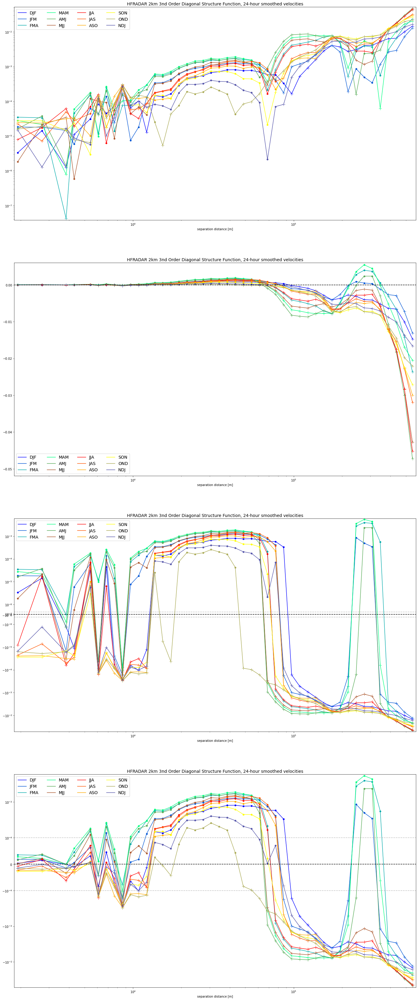

In [331]:
m_seas = personal.IO.pickle_load(os.path.normpath(os.path.join(file_path, output_savepath)) + '/' + 'HFRADAR_2KM_velocity_smoothed_rolling_seas_third_order_diagonal_sf.pkl')['structure_fcn'] 

cmap = LinearSegmentedColormap.from_list("mycmap", [[0,0,1],[0,1,.5],[1,0,0],'yellow',[0,0,1]],N=13)
colors = cmap(np.linspace(0, 1, 13)[0:12])
fig, axes = plt.subplots(nrows=4, ncols=1, figsize=(24,60),facecolor='white') # height, length 
axes_list = axes.flatten()
scales = ['log', 'linear', 'symlog', 'symlog']
nybounds     = [+np.inf, -np.inf]
nybounds_abs = [+np.inf, -np.inf]
for seas in m_seas.keys():
    n    = m_seas[seas]
    nabs = np.abs(n)
    _nybounds     = personal.math.range_bounds(n.values[~np.isinf(n.values) * ~np.isnan(n.values)])
    _nybounds_abs = personal.math.range_bounds(nabs.values[~np.isinf(nabs.values) * ~np.isnan(nabs.values)])
    
    nybounds      = [ np.minimum(_nybounds[0]    ,nybounds[0]),     np.maximum(_nybounds[1]    ,nybounds[1])     ]
    nybounds_abs  = [ np.minimum(_nybounds_abs[0],nybounds_abs[0]), np.maximum(_nybounds_abs[1],nybounds_abs[1]) ]

for i,_ax in enumerate(axes_list):
    for seas, color in zip(m_seas.keys(),colors):
        n = m_seas[seas]
        if i == 0: nn,n = n,np.abs(n)
        if i == 1: nn,n = n,n
        if i == 2: nn,n = n,n
        if i == 3: nn,n = n,n


        n.dropna().plot(ax=_ax,logx=True,logy='sym',ylim=[np.nanmin(n.values[:]),np.nanmax(n.values[:]) ], style='-',c=color, label=seas)
        n[nn>=0].plot(  ax=_ax,logx=True,logy='sym',ylim=[np.nanmin(n.values[:]),np.nanmax(n.values[:]) ], style='o',c=color,markersize=5 , label='_nolegend_',)
        n[nn< 0].plot(  ax=_ax,logx=True,logy='sym',ylim=[np.nanmin(n.values[:]),np.nanmax(n.values[:]) ], style='+',c=color,markersize=10, label='_nolegend_',)

    
    _ax.set_yscale(scales[i])
    ymax = np.max(np.abs(nybounds))
    if i == 2:
        args = personal.plots.calculate_symlog_args(ymax,frac=.02, linthresh_scale=1e-5)
        _ax.axhline( 1*args['linthresh'],color=[.5,.5,.5,.5],linestyle='--')
        _ax.axhline(-1*args['linthresh'],color=[.5,.5,.5,.5],linestyle='--')
    elif i == 3:
        args = personal.plots.calculate_symlog_args(ymax,frac=.2,fixed_linthresh=1e-4)
        _ax.axhline( 1*args['linthresh'],color=[.5,.5,.5,.5],linestyle='--')
        _ax.axhline(-1*args['linthresh'],color=[.5,.5,.5,.5],linestyle='--')
    else:
        args = {}
        
    scale = scales[i]
    _ax.set_yscale(scale, **args)
    if scale != 'log':
        _ax.set_ylim(nybounds * np.power(np.array([1/1.1, 1.1]), np.sign(nybounds)))
    else:
         _ax.set_ylim(np.abs(nybounds_abs) * np.array([.9, +1.1]))

    _ax.set_xlim(nxbounds *.95**np.array([1,-1]))
    
    _ax.axhline(0,linestyle='--',color='k')

    _ax.set_xlabel('separation distance [m]')
    _ax.set_title('HFRADAR 2km 3nd Order Diagonal Structure Function, 24-hour smoothed velocities',fontsize=14)

    leg  = _ax.get_legend_handles_labels()
    leg1 = _ax.legend(leg[0][ 0:12], leg[1][ 0:12], loc='best',ncol=4,fontsize=14)
#     _    = _ax.legend(leg[0][12:  ], leg[1][12:  ], loc='upper left' ,ncol=1, fontsize=14)
    _    = _ax.add_artist(leg1)

In [253]:
# create animation:

<module 'personal.plots' from '/export/home1/jbenjami/Research_Thompson/Python/personal/plots.py'>

In [20]:
import cftime
import datetime
import nc_time_axis
reload(personal.data_structures)
m_seas = personal.IO.pickle_load(os.path.normpath(os.path.join(file_path, output_savepath)) + '/' + 'HFRADAR_2KM_velocity_smoothed_rolling_seas_third_order_diagonal_sf.pkl')['structure_fcn'] 
m_seas = personal.IO.pickle_load(os.path.normpath(os.path.join(file_path, output_savepath)) + '/' + 'HFRADAR_2KM_velocity_rolling_seas_2nd_order_sf.pkl')['structure_fcn'] 

t = xr.cftime_range(start="0000-01-01 12:00:00", periods=12, freq="MS", calendar="noleap") + datetime.timedelta(days=14)

g = personal.data_structures.nested_dict_to_xarray(m_seas,base_fcn = lambda x: (np.array(x.index), np.array(x.values)), dimension_names = {0:'time',1:'r'})
t = np.array([np.datetime64(x) for x in dateutil.rrule.rrule(freq=dateutil.rrule.MONTHLY, count=12, dtstart=datetime.datetime(2000, 1, 15))]).astype(np.datetime64)
g = g.assign_coords({'time':  t })
g

<xarray.DataArray (time: 12, r: 50)>
array([[0.00814035,        nan,        nan, 0.01202435,        nan,
               nan, 0.0180223 , 0.02099745,        nan, 0.02632863,
        0.02879622, 0.03156479, 0.0334247 , 0.03587212, 0.03846617,
        0.04155643, 0.04451897, 0.04659007, 0.0502431 , 0.0535165 ,
        0.0560187 , 0.05976929, 0.06224638, 0.06367815, 0.06588982,
        0.06822864, 0.07066588, 0.07265082, 0.07460907, 0.07747711,
        0.0806863 , 0.0839644 , 0.08776527, 0.08991795, 0.08885264,
        0.08746117, 0.0898782 , 0.09143976, 0.09059804, 0.08597516,
        0.08282501, 0.08410586, 0.08309184, 0.08597339, 0.09270716,
        0.09164321, 0.09172964, 0.09605198, 0.10703447, 0.12943432],
       [0.00865558,        nan,        nan, 0.01281371,        nan,
               nan, 0.01917078, 0.02225653,        nan, 0.02802127,
        0.03047758, 0.03330651, 0.03553029, 0.03807478, 0.0409739 ,
        0.04419103, 0.04734576, 0.0494711 , 0.05340423, 0.05667884,
        0.05941812, 0.06313329, 0.06582205, 0.067265  , 0.06953108,
        0.07190385, 0.07454083, 0.07664297, 0.07888843, 0.08215676,
        0.08553545, 0.0891896 , 0.09305851, 0.09558474, 0.0944302 ,
        0.09266204, 0.0950452 , 0.0969337 , 0.09718612, 0.09385792,
        0.0900342 , 0.09034769, 0.08803593, 0.09106374, 0.09764304,
        0.09721137, 0.09657619, 0.09946154, 0.11087041, 0.1339991 ],
...
       [0.0083112 ,        nan,        nan, 0.01213813,        nan,
               nan, 0.01832556, 0.02132164,        nan, 0.02683482,
        0.02936943, 0.03255452, 0.03425911, 0.03700322, 0.03976668,
        0.0431194 , 0.04635416, 0.04872467, 0.05247916, 0.05611782,
        0.05877557, 0.06300081, 0.06545862, 0.06721089, 0.06956626,
        0.07195031, 0.07415073, 0.07612158, 0.07795747, 0.08032866,
        0.08318685, 0.08636442, 0.09039602, 0.09296302, 0.09259741,
        0.09092671, 0.09196907, 0.09201402, 0.09137045, 0.08949706,
        0.08863554, 0.09045837, 0.09072186, 0.09292735, 0.09749526,
        0.09317683, 0.0950976 , 0.10210871, 0.11385986, 0.12903194],
       [0.007979  ,        nan,        nan, 0.01172273,        nan,
               nan, 0.01766606, 0.02055646,        nan, 0.02579057,
        0.02830253, 0.03119595, 0.03284398, 0.03542204, 0.03793258,
        0.04109046, 0.04410953, 0.04631169, 0.04986876, 0.05321864,
        0.05572017, 0.05963887, 0.06194134, 0.06352862, 0.06570301,
        0.06800289, 0.07025348, 0.07216633, 0.07399257, 0.07661173,
        0.07976455, 0.08302901, 0.08691237, 0.08900318, 0.08803763,
        0.08655971, 0.08843894, 0.089211  , 0.08775025, 0.0843572 ,
        0.08313106, 0.08449005, 0.08436176, 0.08722835, 0.09355284,
        0.08994588, 0.09045093, 0.09553369, 0.10665194, 0.12433   ]])
Coordinates:
  * time     (time) datetime64[ns] 2000-01-15 2000-02-15 ... 2000-12-15
  * r        (r) float64 1.919e+03 2.154e+03 2.417e+03 ... 4.873e+05 5.469e+05

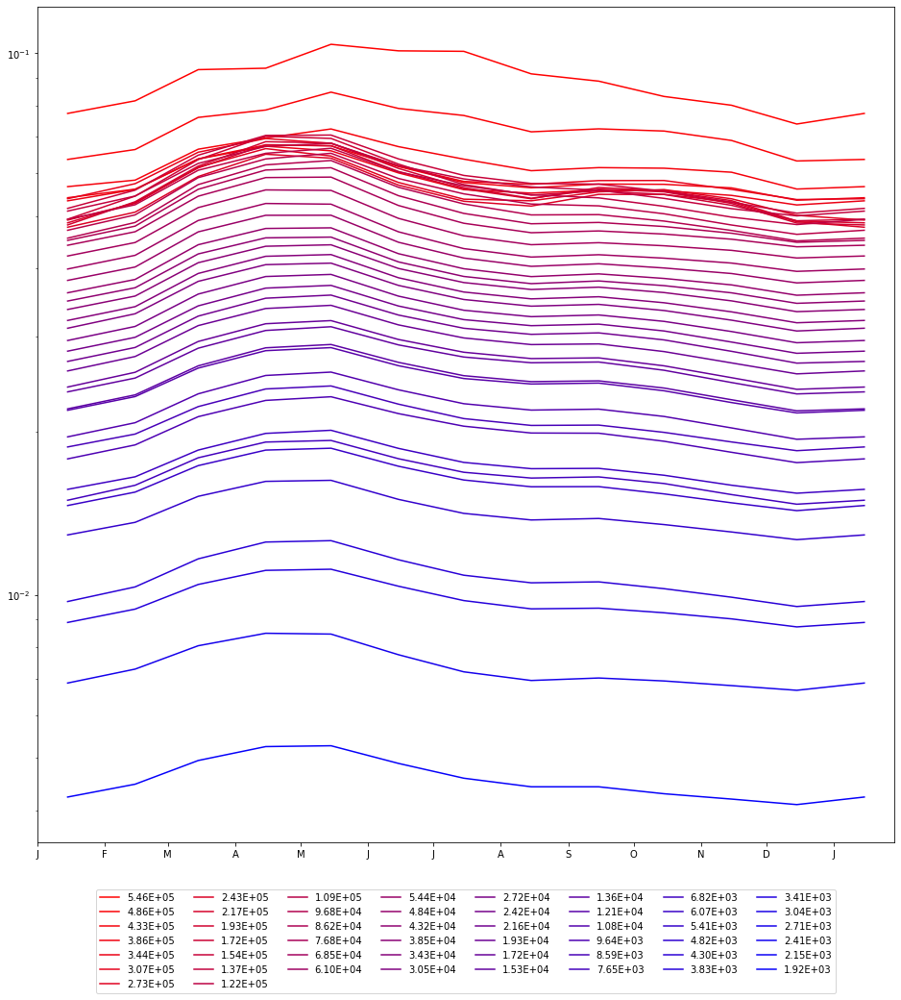

In [563]:
reload(personal.plots)
reload(personal.date_operations)
_data = personal.IO.pickle_load(os.path.normpath(os.path.join(file_path, output_savepath)) + '/' + 'HFRADAR_2KM_velocity_rolling_seas_2nd_order_longitudinal_sf.pkl')['structure_fcn'] 
# _data = personal.IO.pickle_load(os.path.normpath(os.path.join(file_path, output_savepath))         + '/' + 'HFRADAR_2KM_velocity_smoothed_rolling_seas_third_order_diagonal_sf.pkl')['structure_fcn'] 
# _data = personal.IO.pickle_load(os.path.normpath(os.path.join(file_path, output_savepath)) + '/' + 'HFRADAR_2KM_velocity_rolling_seas_2nd_order_sf.pkl')['structure_fcn'] 
_data = personal.data_structures.nested_dict_to_xarray(_data,base_fcn = lambda x: (np.array(x.index), np.array(x.values)), dimension_names = {0:'time',1:'r'})
fig,_ax = personal.plots.plot_2D_array_lines(_data,
                                   fig = plt.figure(figsize=(16,16)),
                                   x = np.array([np.datetime64(x) for x in dateutil.rrule.rrule(freq=dateutil.rrule.MONTHLY, count=len(_data.time), dtstart=datetime.datetime(2000, 1, 15))]).astype(np.datetime64),
                                   n = 80,
                                   style='log',
                                   plot_normalized=False,
                                   repeat_coord_resolver = lambda x: personal.date_operations.np_natural_add_timedelta(x[0], years=1),
                                   x_pad_fcn = lambda x: (personal.date_operations.np_natural_add_timedelta(x[0], days=-14) , personal.date_operations.np_natural_add_timedelta(x[-1], days=+14)) 
                                  )
_ax.xaxis.set_major_locator(mdates.MonthLocator())
_ax.xaxis.set_major_formatter( FuncFormatter(lambda x,pos: mdates.DateFormatter('%b')(x)[0] ))

In [453]:
# Plot seasonal cycles
# TO DO 
# -- add symlog functionality
# -- convert to portable fcn


warnings.filterwarnings('ignore');
_data = personal.IO.pickle_load(os.path.normpath(os.path.join(file_path, output_savepath)) + '/' + 'HFRADAR_2KM_velocity_smoothed_rolling_seas_third_order_diagonal_sf.pkl')['structure_fcn'] 
# _data = personal.IO.pickle_load(os.path.normpath(os.path.join(file_path, output_savepath)) + '/' + 'HFRADAR_2KM_velocity_rolling_seas_2nd_order_sf.pkl')['structure_fcn'] 
# t = xr.cftime_range(start="0000-01-01 12:00:00", periods=12, freq="MS", calendar="noleap") + datetime.timedelta(days=14)
_data = personal.data_structures.nested_dict_to_xarray(_data,base_fcn = lambda x: (np.array(x.index), np.array(x.values)), dimension_names = {0:'time',1:'r'})
t     = np.array([np.datetime64(x) for x in dateutil.rrule.rrule(freq=dateutil.rrule.MONTHLY, count=len(_data.time), dtstart=datetime.datetime(2000, 1, 15))]).astype(np.datetime64)
_data['t_names'] = _data['time']
_data = _data.assign_coords({'time':  t })

n           = 80
r           = _data['r'].values
          
peak           = None  ; r_fcn = lambda r,ind: np.geomspace( r[0], r[-1], n)
# peak           = 'latest min'  ; r_fcn = lambda r,ind: np.geomspace( r[0], r[ind], n)
# peak           = 'earliest max'; r_fcn = lambda r,ind: np.geomspace( r[ind], r[-1], n)
extr_ind,extr_val,_  = personal.math.extreme_extremum_along_axis(_data.values, axis = _data.get_axis_num('r') , extremum = qual)
rs                   = r_fcn(r,extr_ind)
rs_nearest, rsn_inds = personal.data_structures.nearest(rs, r)
rsn_inds,valid       = np.unique(rsn_inds,return_index=True)
rs_nearest           = rs_nearest[valid]


repeat_start_at_end = True
if repeat_start_at_end:
    _data = xr.concat((_data,_data.isel(time=0)), dim='time')
    t     = _data.time.values
    t[-1] = personal.date_operations.np_natural_add_timedelta(t[-1], years=1)
    _data =_data.assign_coords({'time':t})
# else:
#     plot_data = _data.values

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(32,16),facecolor='white') # prepare our 2x2 grid of subplots in side our figure
_ax1,_ax2 = axes

for _ax in axes:
    _ax.set_xlim( xmin = personal.date_operations.np_natural_add_timedelta(_data['time'][0].values, days=-14) , xmax = personal.date_operations.np_natural_add_timedelta(_data['time'][-1].values, days=+14) ) # pads edges a lil
#     _ax.set_xlim( xmin = _data['time'][0].values , xmax=_data['time'][-1].values )
    _ax.xaxis.set_major_locator(mdates.MonthLocator())
    _ax.xaxis.set_major_formatter( FuncFormatter(lambda x,pos: mdates.DateFormatter('%b')(x)[0] ))
    
lc = len(rsn_inds)+1
cmap_here     = LinearSegmentedColormap.from_list("mycmap", [[1,0,0],[0,0,1]],N=lc)
colors_here   = cmap_here(np.linspace(0, 1, lc)[0:lc-1])
newcmap       = ListedColormap(colors_here)
custom_cycler = cycler(color=newcmap.colors) #or simply color=colorlist
_ax.set_prop_cycle(custom_cycler)

yscale_ax1 = 'linear'
for i,ind in enumerate(rsn_inds[::-1]):
    E = _data.isel(r=ind).values
    if yscale_ax1.lower() == 'log':
        E[E<0] = np.nan # only do if log scale to stop there being hella vertical lines
    _ax1.plot(_data.time,E,color = colors_here[i], label=f"{r[ind]:.2E}" )
    E_norm = sklearn.preprocessing.minmax_scale(E,feature_range=(0,1),copy=True)
    _ax2.plot(_data.time,E_norm,color = colors_here[i], label=f"{r[ind]:.2E}" )

# _ax1.set_yscale('linear')   ; _ax1.set_ylim([-2e-2, 1.0e-2]);
_ax1.set_yscale(yscale_ax1)   ; #_ax1.set_ylim([2e-4, 1.0e-2]);
_ax2.set_yscale('linear');_ax2.set_ylim([0,1])
leg1,leg2 =  _ax1.legend(loc='upper center',ncol=8, bbox_to_anchor=(.5, -0.05)), _ax2.legend(loc='upper center',ncol=8, bbox_to_anchor=(.5, -0.05))

In [33]:
_data_

<xarray.Dataset>
Dimensions:   (lat: 256, lon: 166, time: 40000)
Coordinates:
  * lat       (lat) float32 34.00782 34.0258 34.04378 ... 38.57474 38.59272
  * lon       (lon) float32 -123.967705 -123.946884 ... -120.55293 -120.53211
  * time      (time) datetime64[ns] 2012-01-01T01:00:00 ... 2020-09-30T17:00:00
    time_run  (time) datetime64[ns] 2012-01-01T01:00:00 ... 2020-09-30T17:00:00
    baseline  <U3 'all'
    latg      (lat, lon) float32 34.00782 34.00782 ... 38.59272 38.59272
    long      (lat, lon) float32 -123.967705 -123.946884 ... -120.53211
    x         (lat, lon) float64 0.0 1.919e+03 3.838e+03 ... 2.968e+05 2.986e+05
    y         (lat, lon) float64 0.0 0.0 0.0 ... 5.098e+05 5.098e+05 5.098e+05
Data variables:
    u_p       (time, lat, lon) float32 nan nan nan nan nan ... nan nan nan nan
    v_p       (time, lat, lon) float32 nan nan nan nan nan ... nan nan nan nan

In [35]:
_ = gc.collect()
client.restart()

Client Scheduler: tcp://127.0.0.1:46636 Dashboard: http://127.0.0.1:8787/status,Cluster Workers: 6 Cores: 24 Memory: 134.93 GB


In [36]:
del _data_

NameError: name '_data_' is not defined

64

HFRADAR 2KM | Smoothed Velocity | Baseline All | 3rd Order Non-diagonal

calculating

precomputing...
Converting to Dataarray, loading values, then transposing and reshaping...
getting values from DataArray... Done
masking
calculating coordinates
data valid subset is of length:  11429
taking data subset of length 5000 from data (masked subset) of length 11429
calculating distances
binning
calculating structure function...
Processing: all
chunk size: 5000 for total length 12497500 -> 2500.0 chunks
{'n_jobs': 20}


parallelizing


/export/home1/jbenjami/Research_Thompson/Python/personal/calculations.py:351: RuntimeWarning: invalid value encountered in double_scalars
  struct_fun_info[dst_grp] = np.nansum(np.prod(dg,axis=1)) / np.sum(dg[:,1])



saving...
plotting
65

HFRADAR 2KM | Smoothed Velocity | Baseline All | Rolling Seasons | 3rd Order Non-diagonal

calculating
precomputing...
Converting to Dataarray, loading values, then transposing and reshaping...
getting values from DataArray... Done
masking
calculating coordinates
data valid subset is of length:  11430
taking data subset of length 5000 from data (masked subset) of length 11430
calculating distances
binning
calculating structure function...
Processing: DJF
chunk size: 13532 for total length 12497500 -> 924.0 chunks
{'n_jobs': 20}


parallelizing


/export/home1/jbenjami/Research_Thompson/Python/personal/calculations.py:351: RuntimeWarning: invalid value encountered in double_scalars
  struct_fun_info[dst_grp] = np.nansum(np.prod(dg,axis=1)) / np.sum(dg[:,1])



Processing: JFM
chunk size: 13019 for total length 12497500 -> 960.0 chunks
{'n_jobs': 20}


parallelizing

Processing: FMA
chunk size: 13519 for total length 12497500 -> 925.0 chunks
{'n_jobs': 20}


parallelizing

Processing: MAM
chunk size: 13328 for total length 12497500 -> 938.0 chunks
{'n_jobs': 20}


parallelizing

Processing: AMJ
chunk size: 13472 for total length 12497500 -> 928.0 chunks
{'n_jobs': 20}


parallelizing

Processing: MJJ
chunk size: 12907 for total length 12497500 -> 969.0 chunks
{'n_jobs': 20}


parallelizing

Processing: JJA
chunk size: 12508 for total length 12497500 -> 1000.0 chunks
{'n_jobs': 20}


parallelizing

Processing: JAS
chunk size: 12631 for total length 12497500 -> 990.0 chunks
{'n_jobs': 20}


parallelizing

Processing: ASO
chunk size: 13208 for total length 12497500 -> 947.0 chunks
{'n_jobs': 20}


parallelizing

Processing: SON
chunk size: 14061 for total length 12497500 -> 889.0 chunks
{'n_jobs': 20}


parallelizing

Processing: OND
chunk size: 14329 for total length 12497500 -> 873.0 chunks
{'n_jobs': 20}


parallelizing

Processing: NDJ
chunk size: 13729 for total length 12497500 -> 911.0 chunks
{'n_jobs': 20}


parallelizing

saving...
plotting
66

HFRADAR 2KM | Smoothed Velocity | Baseline All | By Month | 3rd Order Non-diagonal

calculating
precomputing...
Converting to Dataarray, loading values, then transposing and reshaping...
getting values from DataArray... Done
masking
calculating coordinates
data valid subset is of length:  11430
taking data subset of length 5000 from data (masked subset) of length 11430
calculating distances
binning
calculating structure function...
Processing: 1
chunk size: 38110 for total length 12497500 -> 328.0 chunks
{'n_jobs': 20}


parallelizing



/export/home1/jbenjami/Research_Thompson/Python/personal/calculations.py:351: RuntimeWarning: invalid value encountered in double_scalars
  struct_fun_info[dst_grp] = np.nansum(np.prod(dg,axis=1)) / np.sum(dg[:,1])


Processing: 2
chunk size: 40650 for total length 12497500 -> 308.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 3
chunk size: 37707 for total length 12497500 -> 332.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 4
chunk size: 42608 for total length 12497500 -> 294.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 5
chunk size: 40209 for total length 12497500 -> 311.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 6
chunk size: 38521 for total length 12497500 -> 325.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 7
chunk size: 37622 for total length 12497500 -> 333.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 8
chunk size: 37850 for total length 12497500 -> 331.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 9
chunk size: 39494 for total length 12497500 -> 317.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 10
chunk size: 41806 for total length 12497500 -> 299.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 11
chunk size: 44464 for total length 12497500 -> 282.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 12
chunk size: 42355 for total length 12497500 -> 296.0 chunks
{'n_jobs': 20}


parallelizing

saving...
plotting
67

HFRADAR 2KM | Smoothed Velocity | Baseline All | Monthly Series | 3rd Order Non-diagonal

calculating
precomputing...
Converting to Dataarray, loading values, then transposing and reshaping...
getting values from DataArray... Done
masking
calculating coordinates
data valid subset is of length:  11430
taking data subset of length 5000 from data (masked subset) of length 11430
calculating distances
binning
calculating structure function...
Processing: 2012-01
chunk size: 330033 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing



/export/home1/jbenjami/Research_Thompson/Python/personal/calculations.py:351: RuntimeWarning: invalid value encountered in double_scalars
  struct_fun_info[dst_grp] = np.nansum(np.prod(dg,axis=1)) / np.sum(dg[:,1])


Processing: 2012-02
chunk size: 373134 for total length 12497500 -> 34.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2012-03
chunk size: 320513 for total length 12497500 -> 39.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2012-04
chunk size: 361011 for total length 12497500 -> 35.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2012-05
chunk size: 331126 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2012-06
chunk size: 346021 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2012-07
chunk size: 327869 for total length 12497500 -> 39.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2012-08
chunk size: 341297 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2012-09
chunk size: 338983 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2012-10
chunk size: 338983 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2012-11
chunk size: 390625 for total length 12497500 -> 32.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2012-12
chunk size: 330033 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2013-01
chunk size: 346021 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2013-02
chunk size: 384615 for total length 12497500 -> 33.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2013-03
chunk size: 347222 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2013-04
chunk size: 2000000 for total length 12497500 -> 7.0 chunks
{'n_jobs': 7}


parallelizing

Processing: 2013-05
chunk size: 917431 for total length 12497500 -> 14.0 chunks
{'n_jobs': 14}


parallelizing

Processing: 2013-06
chunk size: 358423 for total length 12497500 -> 35.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2013-07
chunk size: 344828 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2013-08
chunk size: 344828 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2013-09
chunk size: 359712 for total length 12497500 -> 35.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2013-10
chunk size: 381679 for total length 12497500 -> 33.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2013-11
chunk size: 353357 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2013-12
chunk size: 364964 for total length 12497500 -> 35.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2014-01
chunk size: 328947 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2014-02
chunk size: 381679 for total length 12497500 -> 33.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2014-03
chunk size: 358423 for total length 12497500 -> 35.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2014-04
chunk size: 353357 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2014-05
chunk size: 344828 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2014-06
chunk size: 335570 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2014-07
chunk size: 347222 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2014-08
chunk size: 334448 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2014-09
chunk size: 387597 for total length 12497500 -> 33.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2014-10
chunk size: 316456 for total length 12497500 -> 40.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2014-11
chunk size: 321543 for total length 12497500 -> 39.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2014-12
chunk size: 374532 for total length 12497500 -> 34.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2015-01
chunk size: 341297 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2015-02
chunk size: 386100 for total length 12497500 -> 33.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2015-03
chunk size: 335570 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2015-04
chunk size: 358423 for total length 12497500 -> 35.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2015-05
chunk size: 352113 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2015-06
chunk size: 363636 for total length 12497500 -> 35.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2015-07
chunk size: 314465 for total length 12497500 -> 40.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2015-08
chunk size: 343643 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2015-09
chunk size: 319489 for total length 12497500 -> 40.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2015-10
chunk size: 352113 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2015-11
chunk size: 374532 for total length 12497500 -> 34.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2015-12
chunk size: 321543 for total length 12497500 -> 39.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2016-01
chunk size: 347222 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2016-02
chunk size: 359712 for total length 12497500 -> 35.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2016-03
chunk size: 333333 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2016-04
chunk size: 337838 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2016-05
chunk size: 302115 for total length 12497500 -> 42.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2016-06
chunk size: 354610 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2016-07
chunk size: 347222 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2016-08
chunk size: 337838 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2016-09
chunk size: 364964 for total length 12497500 -> 35.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2016-10
chunk size: 341297 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2016-11
chunk size: 341297 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2016-12
chunk size: 354610 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2017-01
chunk size: 347222 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2017-02
chunk size: 373134 for total length 12497500 -> 34.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2017-03
chunk size: 346021 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2017-04
chunk size: 363636 for total length 12497500 -> 35.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2017-05
chunk size: 350877 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2017-06
chunk size: 359712 for total length 12497500 -> 35.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2017-07
chunk size: 320513 for total length 12497500 -> 39.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2017-08
chunk size: 308642 for total length 12497500 -> 41.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2017-09
chunk size: 352113 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2017-10
chunk size: 324675 for total length 12497500 -> 39.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2017-11
chunk size: 344828 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2017-12
chunk size: 335570 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2018-01
chunk size: 331126 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2018-02
chunk size: 359712 for total length 12497500 -> 35.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2018-03
chunk size: 336700 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2018-04
chunk size: 346021 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2018-05
chunk size: 316456 for total length 12497500 -> 40.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2018-06
chunk size: 357143 for total length 12497500 -> 35.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2018-07
chunk size: 340136 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2018-08
chunk size: 333333 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2018-09
chunk size: 413223 for total length 12497500 -> 31.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2018-10
chunk size: 350877 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2018-11
chunk size: 349650 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2018-12
chunk size: 335570 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2019-01
chunk size: 320513 for total length 12497500 -> 39.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2019-02
chunk size: 362319 for total length 12497500 -> 35.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2019-03
chunk size: 341297 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2019-04
chunk size: 354610 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2019-05
chunk size: 342466 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2019-06
chunk size: 337838 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2019-07
chunk size: 319489 for total length 12497500 -> 40.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2019-08
chunk size: 328947 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2019-09
chunk size: 357143 for total length 12497500 -> 35.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2019-10
chunk size: 358423 for total length 12497500 -> 35.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2019-11
chunk size: 347222 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2019-12
chunk size: 319489 for total length 12497500 -> 40.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2020-01
chunk size: 327869 for total length 12497500 -> 39.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2020-02
chunk size: 334448 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2020-03
chunk size: 340136 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2020-04
chunk size: 352113 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2020-05
chunk size: 322581 for total length 12497500 -> 39.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2020-06
chunk size: 362319 for total length 12497500 -> 35.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2020-07
chunk size: 364964 for total length 12497500 -> 35.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2020-08
chunk size: 322581 for total length 12497500 -> 39.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2020-09
chunk size: 362319 for total length 12497500 -> 35.0 chunks
{'n_jobs': 20}


parallelizing

saving...
plotting
68

HFRADAR 2KM | Smoothed Velocity | 3rd Order Non-diagonal

calculating
precomputing...
Converting to Dataarray, loading values, then transposing and reshaping...
getting values from DataArray... Done
masking
calculating coordinates
data valid subset is of length:  11430
taking data subset of length 5000 from data (masked subset) of length 11430
calculating distances
binning
calculating structure function...
Processing: all
chunk size: 5000 for total length 12497500 -> 2500.0 chunks
{'n_jobs': 20}


parallelizing


/export/home1/jbenjami/Research_Thompson/Python/personal/calculations.py:351: RuntimeWarning: invalid value encountered in double_scalars
  struct_fun_info[dst_grp] = np.nansum(np.prod(dg,axis=1)) / np.sum(dg[:,1])



saving...
plotting
69

HFRADAR 2KM | Smoothed Velocity | Rolling Seasons | 3rd Order Non-diagonal

calculating
precomputing...
Converting to Dataarray, loading values, then transposing and reshaping...
getting values from DataArray... Done
masking
calculating coordinates
data valid subset is of length:  11430
taking data subset of length 5000 from data (masked subset) of length 11430
calculating distances
binning
calculating structure function...
Processing: DJF
chunk size: 13360 for total length 12497500 -> 936.0 chunks
{'n_jobs': 20}


parallelizing


/export/home1/jbenjami/Research_Thompson/Python/personal/calculations.py:351: RuntimeWarning: invalid value encountered in double_scalars
  struct_fun_info[dst_grp] = np.nansum(np.prod(dg,axis=1)) / np.sum(dg[:,1])



Processing: JFM
chunk size: 12890 for total length 12497500 -> 970.0 chunks
{'n_jobs': 20}


parallelizing

Processing: FMA
chunk size: 13486 for total length 12497500 -> 927.0 chunks
{'n_jobs': 20}


parallelizing

Processing: MAM
chunk size: 13430 for total length 12497500 -> 931.0 chunks
{'n_jobs': 20}


parallelizing

Processing: AMJ
chunk size: 13665 for total length 12497500 -> 915.0 chunks
{'n_jobs': 20}


parallelizing

Processing: MJJ
chunk size: 13024 for total length 12497500 -> 960.0 chunks
{'n_jobs': 20}


parallelizing

Processing: JJA
chunk size: 12694 for total length 12497500 -> 985.0 chunks
{'n_jobs': 20}


parallelizing

Processing: JAS
chunk size: 12665 for total length 12497500 -> 987.0 chunks
{'n_jobs': 20}


parallelizing

Processing: ASO
chunk size: 13129 for total length 12497500 -> 952.0 chunks
{'n_jobs': 20}


parallelizing

Processing: SON
chunk size: 13906 for total length 12497500 -> 899.0 chunks
{'n_jobs': 20}


parallelizing

Processing: OND
chunk size: 14229 for total length 12497500 -> 879.0 chunks
{'n_jobs': 20}


parallelizing

Processing: NDJ
chunk size: 13717 for total length 12497500 -> 912.0 chunks
{'n_jobs': 20}


parallelizing

saving...
plotting
70

HFRADAR 2KM | Smoothed Velocity | By Month | 3rd Order Non-diagonal

calculating
precomputing...
Converting to Dataarray, loading values, then transposing and reshaping...
getting values from DataArray... Done
masking
calculating coordinates
data valid subset is of length:  11430
taking data subset of length 5000 from data (masked subset) of length 11430
calculating distances
binning
calculating structure function...
Processing: 1
chunk size: 37722 for total length 12497500 -> 332.0 chunks
{'n_jobs': 20}


parallelizing


/export/home1/jbenjami/Research_Thompson/Python/personal/calculations.py:351: RuntimeWarning: invalid value encountered in double_scalars
  struct_fun_info[dst_grp] = np.nansum(np.prod(dg,axis=1)) / np.sum(dg[:,1])



Processing: 2
chunk size: 41511 for total length 12497500 -> 302.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 3
chunk size: 37383 for total length 12497500 -> 335.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 4
chunk size: 42517 for total length 12497500 -> 294.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 5
chunk size: 40404 for total length 12497500 -> 310.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 6
chunk size: 39308 for total length 12497500 -> 318.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 7
chunk size: 37538 for total length 12497500 -> 333.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 8
chunk size: 37665 for total length 12497500 -> 332.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 9
chunk size: 38183 for total length 12497500 -> 328.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 10
chunk size: 42034 for total length 12497500 -> 298.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 11
chunk size: 44366 for total length 12497500 -> 282.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 12
chunk size: 43048 for total length 12497500 -> 291.0 chunks
{'n_jobs': 20}


parallelizing

saving...
plotting
71

HFRADAR 2KM | Smoothed Velocity | Monthly Series | 3rd Order Non-diagonal

calculating
precomputing...
Converting to Dataarray, loading values, then transposing and reshaping...
getting values from DataArray... Done
masking
calculating coordinates
data valid subset is of length:  11430
taking data subset of length 5000 from data (masked subset) of length 11430
calculating distances
binning
calculating structure function...
Processing: 2012-01
chunk size: 334448 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing



/export/home1/jbenjami/Research_Thompson/Python/personal/calculations.py:351: RuntimeWarning: invalid value encountered in double_scalars
  struct_fun_info[dst_grp] = np.nansum(np.prod(dg,axis=1)) / np.sum(dg[:,1])


Processing: 2012-02
chunk size: 346021 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2012-03
chunk size: 343643 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2012-04
chunk size: 335570 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2012-05
chunk size: 335570 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2012-06
chunk size: 344828 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2012-07
chunk size: 323625 for total length 12497500 -> 39.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2012-08
chunk size: 347222 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2012-09
chunk size: 333333 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2012-10
chunk size: 333333 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2012-11
chunk size: 318471 for total length 12497500 -> 40.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2012-12
chunk size: 331126 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2013-01
chunk size: 340136 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2013-02
chunk size: 395257 for total length 12497500 -> 32.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2013-03
chunk size: 358423 for total length 12497500 -> 35.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2013-04
chunk size: 2127660 for total length 12497500 -> 6.0 chunks
{'n_jobs': 6}


parallelizing

Processing: 2013-05
chunk size: 884956 for total length 12497500 -> 15.0 chunks
{'n_jobs': 15}


parallelizing

Processing: 2013-06
chunk size: 359712 for total length 12497500 -> 35.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2013-07
chunk size: 362319 for total length 12497500 -> 35.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2013-08
chunk size: 325733 for total length 12497500 -> 39.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2013-09
chunk size: 359712 for total length 12497500 -> 35.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2013-10
chunk size: 353357 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2013-11
chunk size: 369004 for total length 12497500 -> 34.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2013-12
chunk size: 331126 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2014-01
chunk size: 332226 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2014-02
chunk size: 396825 for total length 12497500 -> 32.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2014-03
chunk size: 330033 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2014-04
chunk size: 359712 for total length 12497500 -> 35.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2014-05
chunk size: 344828 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2014-06
chunk size: 354610 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2014-07
chunk size: 338983 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2014-08
chunk size: 373134 for total length 12497500 -> 34.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2014-09
chunk size: 340136 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2014-10
chunk size: 349650 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2014-11
chunk size: 336700 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2014-12
chunk size: 341297 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2015-01
chunk size: 334448 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2015-02
chunk size: 374532 for total length 12497500 -> 34.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2015-03
chunk size: 337838 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2015-04
chunk size: 352113 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2015-05
chunk size: 340136 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2015-06
chunk size: 350877 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2015-07
chunk size: 344828 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2015-08
chunk size: 336700 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2015-09
chunk size: 369004 for total length 12497500 -> 34.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2015-10
chunk size: 358423 for total length 12497500 -> 35.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2015-11
chunk size: 366300 for total length 12497500 -> 35.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2015-12
chunk size: 334448 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2016-01
chunk size: 375940 for total length 12497500 -> 34.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2016-02
chunk size: 361011 for total length 12497500 -> 35.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2016-03
chunk size: 318471 for total length 12497500 -> 40.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2016-04
chunk size: 358423 for total length 12497500 -> 35.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2016-05
chunk size: 357143 for total length 12497500 -> 35.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2016-06
chunk size: 342466 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2016-07
chunk size: 338983 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2016-08
chunk size: 353357 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2016-09
chunk size: 355872 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2016-10
chunk size: 336700 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2016-11
chunk size: 343643 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2016-12
chunk size: 341297 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2017-01
chunk size: 318471 for total length 12497500 -> 40.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2017-02
chunk size: 406504 for total length 12497500 -> 31.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2017-03
chunk size: 324675 for total length 12497500 -> 39.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2017-04
chunk size: 336700 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2017-05
chunk size: 322581 for total length 12497500 -> 39.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2017-06
chunk size: 344828 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2017-07
chunk size: 328947 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2017-08
chunk size: 333333 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2017-09
chunk size: 355872 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2017-10
chunk size: 350877 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2017-11
chunk size: 361011 for total length 12497500 -> 35.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2017-12
chunk size: 335570 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2018-01
chunk size: 331126 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2018-02
chunk size: 347222 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2018-03
chunk size: 338983 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2018-04
chunk size: 347222 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2018-05
chunk size: 330033 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2018-06
chunk size: 355872 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2018-07
chunk size: 357143 for total length 12497500 -> 35.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2018-08
chunk size: 346021 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2018-09
chunk size: 344828 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2018-10
chunk size: 341297 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2018-11
chunk size: 366300 for total length 12497500 -> 35.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2018-12
chunk size: 341297 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2019-01
chunk size: 352113 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2019-02
chunk size: 384615 for total length 12497500 -> 33.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2019-03
chunk size: 316456 for total length 12497500 -> 40.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2019-04
chunk size: 367647 for total length 12497500 -> 34.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2019-05
chunk size: 318471 for total length 12497500 -> 40.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2019-06
chunk size: 352113 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2019-07
chunk size: 334448 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2019-08
chunk size: 324675 for total length 12497500 -> 39.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2019-09
chunk size: 350877 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2019-10
chunk size: 346021 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2019-11
chunk size: 342466 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2019-12
chunk size: 330033 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2020-01
chunk size: 333333 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2020-02
chunk size: 375940 for total length 12497500 -> 34.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2020-03
chunk size: 333333 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2020-04
chunk size: 325733 for total length 12497500 -> 39.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2020-05
chunk size: 334448 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2020-06
chunk size: 347222 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2020-07
chunk size: 349650 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2020-08
chunk size: 325733 for total length 12497500 -> 39.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2020-09
chunk size: 362319 for total length 12497500 -> 35.0 chunks
{'n_jobs': 20}


parallelizing

saving...
plotting
72

HFRADAR 2KM | Velocity | Baseline All | 3rd Order Non-diagonal

calculating
precomputing...
Converting to Dataarray, loading values, then transposing and reshaping...
getting values from DataArray... Done
masking
calculating coordinates
data valid subset is of length:  11135
taking data subset of length 5000 from data (masked subset) of length 11135
calculating distances
binning
calculating structure function...
Processing: all
chunk size: 5000 for total length 12497500 -> 2500.0 chunks
{'n_jobs': 20}


parallelizing


/export/home1/jbenjami/Research_Thompson/Python/personal/calculations.py:351: RuntimeWarning: invalid value encountered in double_scalars
  struct_fun_info[dst_grp] = np.nansum(np.prod(dg,axis=1)) / np.sum(dg[:,1])



saving...
plotting
73

HFRADAR 2KM | Velocity | Baseline All | Rolling Seasons | 3rd Order Non-diagonal

calculating
precomputing...
Converting to Dataarray, loading values, then transposing and reshaping...
getting values from DataArray... Done
masking
calculating coordinates
data valid subset is of length:  11151
taking data subset of length 5000 from data (masked subset) of length 11151
calculating distances
binning
calculating structure function...
Processing: DJF
chunk size: 13515 for total length 12497500 -> 925.0 chunks
{'n_jobs': 20}


parallelizing


/export/home1/jbenjami/Research_Thompson/Python/personal/calculations.py:351: RuntimeWarning: invalid value encountered in double_scalars
  struct_fun_info[dst_grp] = np.nansum(np.prod(dg,axis=1)) / np.sum(dg[:,1])



Processing: JFM
chunk size: 12968 for total length 12497500 -> 964.0 chunks
{'n_jobs': 20}


parallelizing

Processing: FMA
chunk size: 13421 for total length 12497500 -> 932.0 chunks
{'n_jobs': 20}


parallelizing

Processing: MAM
chunk size: 13466 for total length 12497500 -> 929.0 chunks
{'n_jobs': 20}


parallelizing

Processing: AMJ
chunk size: 13693 for total length 12497500 -> 913.0 chunks
{'n_jobs': 20}


parallelizing

Processing: MJJ
chunk size: 13191 for total length 12497500 -> 948.0 chunks
{'n_jobs': 20}


parallelizing

Processing: JJA
chunk size: 12765 for total length 12497500 -> 980.0 chunks
{'n_jobs': 20}


parallelizing

Processing: JAS
chunk size: 12698 for total length 12497500 -> 985.0 chunks
{'n_jobs': 20}


parallelizing

Processing: ASO
chunk size: 13040 for total length 12497500 -> 959.0 chunks
{'n_jobs': 20}


parallelizing

Processing: SON
chunk size: 13622 for total length 12497500 -> 918.0 chunks
{'n_jobs': 20}


parallelizing

Processing: OND
chunk size: 14063 for total length 12497500 -> 889.0 chunks
{'n_jobs': 20}


parallelizing

Processing: NDJ
chunk size: 13701 for total length 12497500 -> 913.0 chunks
{'n_jobs': 20}


parallelizing

saving...
plotting
74

HFRADAR 2KM | Velocity | Baseline All | By Month | 3rd Order Non-diagonal

calculating
precomputing...
Converting to Dataarray, loading values, then transposing and reshaping...
getting values from DataArray... Done
masking
calculating coordinates
data valid subset is of length:  11167
taking data subset of length 5000 from data (masked subset) of length 11167
calculating distances
binning
calculating structure function...
Processing: 1
chunk size: 38344 for total length 12497500 -> 326.0 chunks
{'n_jobs': 20}


parallelizing



/export/home1/jbenjami/Research_Thompson/Python/personal/calculations.py:351: RuntimeWarning: invalid value encountered in double_scalars
  struct_fun_info[dst_grp] = np.nansum(np.prod(dg,axis=1)) / np.sum(dg[:,1])


Processing: 2
chunk size: 40388 for total length 12497500 -> 310.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 3
chunk size: 37836 for total length 12497500 -> 331.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 4
chunk size: 43290 for total length 12497500 -> 289.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 5
chunk size: 40241 for total length 12497500 -> 311.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 6
chunk size: 38986 for total length 12497500 -> 321.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 7
chunk size: 37202 for total length 12497500 -> 336.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 8
chunk size: 36982 for total length 12497500 -> 338.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 9
chunk size: 39324 for total length 12497500 -> 318.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 10
chunk size: 42283 for total length 12497500 -> 296.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 11
chunk size: 44248 for total length 12497500 -> 283.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 12
chunk size: 42499 for total length 12497500 -> 295.0 chunks
{'n_jobs': 20}


parallelizing

saving...
plotting
75

HFRADAR 2KM | Velocity | Baseline All | Monthly Series | 3rd Order Non-diagonal

calculating
precomputing...
Converting to Dataarray, loading values, then transposing and reshaping...
getting values from DataArray... Done
masking
calculating coordinates
data valid subset is of length:  11128
taking data subset of length 5000 from data (masked subset) of length 11128
calculating distances
binning
calculating structure function...
Processing: 2012-01
chunk size: 320513 for total length 12497500 -> 39.0 chunks
{'n_jobs': 20}


parallelizing



/export/home1/jbenjami/Research_Thompson/Python/personal/calculations.py:351: RuntimeWarning: invalid value encountered in double_scalars
  struct_fun_info[dst_grp] = np.nansum(np.prod(dg,axis=1)) / np.sum(dg[:,1])


Processing: 2012-02
chunk size: 367647 for total length 12497500 -> 34.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2012-03
chunk size: 334448 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2012-04
chunk size: 359712 for total length 12497500 -> 35.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2012-05
chunk size: 371747 for total length 12497500 -> 34.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2012-06
chunk size: 338983 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2012-07
chunk size: 343643 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2012-08
chunk size: 337838 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2012-09
chunk size: 353357 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2012-10
chunk size: 321543 for total length 12497500 -> 39.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2012-11
chunk size: 349650 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2012-12
chunk size: 313480 for total length 12497500 -> 40.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2013-01
chunk size: 338983 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2013-02
chunk size: 364964 for total length 12497500 -> 35.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2013-03
chunk size: 353357 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2013-04
chunk size: 2325581 for total length 12497500 -> 6.0 chunks
{'n_jobs': 6}


parallelizing

Processing: 2013-05
chunk size: 819672 for total length 12497500 -> 16.0 chunks
{'n_jobs': 16}


parallelizing

Processing: 2013-06
chunk size: 355872 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2013-07
chunk size: 340136 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2013-08
chunk size: 334448 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2013-09
chunk size: 357143 for total length 12497500 -> 35.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2013-10
chunk size: 325733 for total length 12497500 -> 39.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2013-11
chunk size: 342466 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2013-12
chunk size: 344828 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2014-01
chunk size: 332226 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2014-02
chunk size: 357143 for total length 12497500 -> 35.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2014-03
chunk size: 384615 for total length 12497500 -> 33.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2014-04
chunk size: 323625 for total length 12497500 -> 39.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2014-05
chunk size: 319489 for total length 12497500 -> 40.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2014-06
chunk size: 362319 for total length 12497500 -> 35.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2014-07
chunk size: 327869 for total length 12497500 -> 39.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2014-08
chunk size: 322581 for total length 12497500 -> 39.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2014-09
chunk size: 375940 for total length 12497500 -> 34.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2014-10
chunk size: 343643 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2014-11
chunk size: 343643 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2014-12
chunk size: 344828 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2015-01
chunk size: 334448 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2015-02
chunk size: 370370 for total length 12497500 -> 34.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2015-03
chunk size: 377358 for total length 12497500 -> 34.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2015-04
chunk size: 338983 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2015-05
chunk size: 341297 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2015-06
chunk size: 386100 for total length 12497500 -> 33.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2015-07
chunk size: 361011 for total length 12497500 -> 35.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2015-08
chunk size: 330033 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2015-09
chunk size: 328947 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2015-10
chunk size: 334448 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2015-11
chunk size: 357143 for total length 12497500 -> 35.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2015-12
chunk size: 333333 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2016-01
chunk size: 362319 for total length 12497500 -> 35.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2016-02
chunk size: 375940 for total length 12497500 -> 34.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2016-03
chunk size: 364964 for total length 12497500 -> 35.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2016-04
chunk size: 348432 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2016-05
chunk size: 318471 for total length 12497500 -> 40.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2016-06
chunk size: 346021 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2016-07
chunk size: 350877 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2016-08
chunk size: 320513 for total length 12497500 -> 39.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2016-09
chunk size: 331126 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2016-10
chunk size: 307692 for total length 12497500 -> 41.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2016-11
chunk size: 321543 for total length 12497500 -> 39.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2016-12
chunk size: 327869 for total length 12497500 -> 39.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2017-01
chunk size: 327869 for total length 12497500 -> 39.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2017-02
chunk size: 395257 for total length 12497500 -> 32.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2017-03
chunk size: 335570 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2017-04
chunk size: 342466 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2017-05
chunk size: 327869 for total length 12497500 -> 39.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2017-06
chunk size: 337838 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2017-07
chunk size: 323625 for total length 12497500 -> 39.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2017-08
chunk size: 357143 for total length 12497500 -> 35.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2017-09
chunk size: 357143 for total length 12497500 -> 35.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2017-10
chunk size: 320513 for total length 12497500 -> 39.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2017-11
chunk size: 348432 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2017-12
chunk size: 334448 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2018-01
chunk size: 331126 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2018-02
chunk size: 363636 for total length 12497500 -> 35.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2018-03
chunk size: 344828 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2018-04
chunk size: 380228 for total length 12497500 -> 33.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2018-05
chunk size: 346021 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2018-06
chunk size: 353357 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2018-07
chunk size: 350877 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2018-08
chunk size: 338983 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2018-09
chunk size: 349650 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2018-10
chunk size: 348432 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2018-11
chunk size: 348432 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2018-12
chunk size: 355872 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2019-01
chunk size: 332226 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2019-02
chunk size: 396825 for total length 12497500 -> 32.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2019-03
chunk size: 331126 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2019-04
chunk size: 349650 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2019-05
chunk size: 326797 for total length 12497500 -> 39.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2019-06
chunk size: 358423 for total length 12497500 -> 35.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2019-07
chunk size: 337838 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2019-08
chunk size: 348432 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2019-09
chunk size: 330033 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2019-10
chunk size: 324675 for total length 12497500 -> 39.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2019-11
chunk size: 371747 for total length 12497500 -> 34.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2019-12
chunk size: 326797 for total length 12497500 -> 39.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2020-01
chunk size: 358423 for total length 12497500 -> 35.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2020-02
chunk size: 384615 for total length 12497500 -> 33.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2020-03
chunk size: 350877 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2020-04
chunk size: 344828 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2020-05
chunk size: 337838 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2020-06
chunk size: 392157 for total length 12497500 -> 32.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2020-07
chunk size: 340136 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2020-08
chunk size: 342466 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2020-09
chunk size: 381679 for total length 12497500 -> 33.0 chunks
{'n_jobs': 20}


parallelizing

saving...
plotting
76

HFRADAR 2KM | Velocity | 3rd Order Non-diagonal

calculating
precomputing...
Converting to Dataarray, loading values, then transposing and reshaping...
getting values from DataArray... Done
masking
calculating coordinates
data valid subset is of length:  11100
taking data subset of length 5000 from data (masked subset) of length 11100
calculating distances
binning
calculating structure function...
Processing: all
chunk size: 5000 for total length 12497500 -> 2500.0 chunks
{'n_jobs': 20}


parallelizing


/export/home1/jbenjami/Research_Thompson/Python/personal/calculations.py:351: RuntimeWarning: invalid value encountered in double_scalars
  struct_fun_info[dst_grp] = np.nansum(np.prod(dg,axis=1)) / np.sum(dg[:,1])



saving...
plotting
77

HFRADAR 2KM | Velocity | Rolling Seasons | 3rd Order Non-diagonal

calculating
precomputing...
Converting to Dataarray, loading values, then transposing and reshaping...
getting values from DataArray... Done
masking
calculating coordinates
data valid subset is of length:  11152
taking data subset of length 5000 from data (masked subset) of length 11152
calculating distances
binning
calculating structure function...
Processing: DJF
chunk size: 13390 for total length 12497500 -> 934.0 chunks
{'n_jobs': 20}


parallelizing


/export/home1/jbenjami/Research_Thompson/Python/personal/calculations.py:351: RuntimeWarning: invalid value encountered in double_scalars
  struct_fun_info[dst_grp] = np.nansum(np.prod(dg,axis=1)) / np.sum(dg[:,1])



Processing: JFM
chunk size: 12875 for total length 12497500 -> 971.0 chunks
{'n_jobs': 20}


parallelizing

Processing: FMA
chunk size: 13477 for total length 12497500 -> 928.0 chunks
{'n_jobs': 20}


parallelizing

Processing: MAM
chunk size: 13371 for total length 12497500 -> 935.0 chunks
{'n_jobs': 20}


parallelizing

Processing: AMJ
chunk size: 13559 for total length 12497500 -> 922.0 chunks
{'n_jobs': 20}


parallelizing

Processing: MJJ
chunk size: 12982 for total length 12497500 -> 963.0 chunks
{'n_jobs': 20}


parallelizing

Processing: JJA
chunk size: 12652 for total length 12497500 -> 988.0 chunks
{'n_jobs': 20}


parallelizing

Processing: JAS
chunk size: 12674 for total length 12497500 -> 987.0 chunks
{'n_jobs': 20}


parallelizing

Processing: ASO
chunk size: 13142 for total length 12497500 -> 951.0 chunks
{'n_jobs': 20}


parallelizing

Processing: SON
chunk size: 13988 for total length 12497500 -> 894.0 chunks
{'n_jobs': 20}


parallelizing

Processing: OND
chunk size: 14351 for total length 12497500 -> 871.0 chunks
{'n_jobs': 20}


parallelizing

Processing: NDJ
chunk size: 13759 for total length 12497500 -> 909.0 chunks
{'n_jobs': 20}


parallelizing

saving...
plotting
78

HFRADAR 2KM | Velocity | By Month | 3rd Order Non-diagonal

calculating
precomputing...
Converting to Dataarray, loading values, then transposing and reshaping...
getting values from DataArray... Done
masking
calculating coordinates
data valid subset is of length:  11253
taking data subset of length 5000 from data (masked subset) of length 11253
calculating distances
binning
calculating structure function...
Processing: 1
chunk size: 37481 for total length 12497500 -> 334.0 chunks
{'n_jobs': 20}


parallelizing



/export/home1/jbenjami/Research_Thompson/Python/personal/calculations.py:351: RuntimeWarning: invalid value encountered in double_scalars
  struct_fun_info[dst_grp] = np.nansum(np.prod(dg,axis=1)) / np.sum(dg[:,1])


Processing: 2
chunk size: 41632 for total length 12497500 -> 301.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 3
chunk size: 37538 for total length 12497500 -> 333.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 4
chunk size: 41964 for total length 12497500 -> 298.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 5
chunk size: 40437 for total length 12497500 -> 310.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 6
chunk size: 38655 for total length 12497500 -> 324.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 7
chunk size: 37679 for total length 12497500 -> 332.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 8
chunk size: 37327 for total length 12497500 -> 335.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 9
chunk size: 38880 for total length 12497500 -> 322.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 10
chunk size: 43141 for total length 12497500 -> 290.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 11
chunk size: 44984 for total length 12497500 -> 278.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 12
chunk size: 42070 for total length 12497500 -> 298.0 chunks
{'n_jobs': 20}


parallelizing

saving...
plotting
79

HFRADAR 2KM | Velocity | Monthly Series | 3rd Order Non-diagonal

calculating
precomputing...
Converting to Dataarray, loading values, then transposing and reshaping...
getting values from DataArray... Done
masking
calculating coordinates
data valid subset is of length:  11210
taking data subset of length 5000 from data (masked subset) of length 11210
calculating distances
binning
calculating structure function...
Processing: 2012-01
chunk size: 332226 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing



/export/home1/jbenjami/Research_Thompson/Python/personal/calculations.py:351: RuntimeWarning: invalid value encountered in double_scalars
  struct_fun_info[dst_grp] = np.nansum(np.prod(dg,axis=1)) / np.sum(dg[:,1])


Processing: 2012-02
chunk size: 371747 for total length 12497500 -> 34.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2012-03
chunk size: 361011 for total length 12497500 -> 35.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2012-04
chunk size: 350877 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2012-05
chunk size: 343643 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2012-06
chunk size: 348432 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2012-07
chunk size: 354610 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2012-08
chunk size: 349650 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2012-09
chunk size: 370370 for total length 12497500 -> 34.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2012-10
chunk size: 338983 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2012-11
chunk size: 349650 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2012-12
chunk size: 328947 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2013-01
chunk size: 352113 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2013-02
chunk size: 381679 for total length 12497500 -> 33.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2013-03
chunk size: 350877 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2013-04
chunk size: 2272727 for total length 12497500 -> 6.0 chunks
{'n_jobs': 6}


parallelizing

Processing: 2013-05
chunk size: 943396 for total length 12497500 -> 14.0 chunks
{'n_jobs': 14}


parallelizing

Processing: 2013-06
chunk size: 337838 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2013-07
chunk size: 341297 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2013-08
chunk size: 328947 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2013-09
chunk size: 337838 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2013-10
chunk size: 320513 for total length 12497500 -> 39.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2013-11
chunk size: 375940 for total length 12497500 -> 34.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2013-12
chunk size: 319489 for total length 12497500 -> 40.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2014-01
chunk size: 348432 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2014-02
chunk size: 374532 for total length 12497500 -> 34.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2014-03
chunk size: 327869 for total length 12497500 -> 39.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2014-04
chunk size: 375940 for total length 12497500 -> 34.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2014-05
chunk size: 330033 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2014-06
chunk size: 333333 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2014-07
chunk size: 337838 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2014-08
chunk size: 350877 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2014-09
chunk size: 359712 for total length 12497500 -> 35.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2014-10
chunk size: 323625 for total length 12497500 -> 39.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2014-11
chunk size: 338983 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2014-12
chunk size: 330033 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2015-01
chunk size: 325733 for total length 12497500 -> 39.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2015-02
chunk size: 354610 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2015-03
chunk size: 320513 for total length 12497500 -> 39.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2015-04
chunk size: 353357 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2015-05
chunk size: 338983 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2015-06
chunk size: 336700 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2015-07
chunk size: 367647 for total length 12497500 -> 34.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2015-08
chunk size: 340136 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2015-09
chunk size: 319489 for total length 12497500 -> 40.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2015-10
chunk size: 354610 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2015-11
chunk size: 348432 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2015-12
chunk size: 333333 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2016-01
chunk size: 310559 for total length 12497500 -> 41.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2016-02
chunk size: 348432 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2016-03
chunk size: 336700 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2016-04
chunk size: 336700 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2016-05
chunk size: 334448 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2016-06
chunk size: 344828 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2016-07
chunk size: 350877 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2016-08
chunk size: 334448 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2016-09
chunk size: 349650 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2016-10
chunk size: 350877 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2016-11
chunk size: 334448 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2016-12
chunk size: 333333 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2017-01
chunk size: 359712 for total length 12497500 -> 35.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2017-02
chunk size: 350877 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2017-03
chunk size: 343643 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2017-04
chunk size: 334448 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2017-05
chunk size: 366300 for total length 12497500 -> 35.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2017-06
chunk size: 361011 for total length 12497500 -> 35.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2017-07
chunk size: 315457 for total length 12497500 -> 40.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2017-08
chunk size: 334448 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2017-09
chunk size: 341297 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2017-10
chunk size: 346021 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2017-11
chunk size: 377358 for total length 12497500 -> 34.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2017-12
chunk size: 336700 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2018-01
chunk size: 341297 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2018-02
chunk size: 420168 for total length 12497500 -> 30.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2018-03
chunk size: 331126 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2018-04
chunk size: 333333 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2018-05
chunk size: 349650 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2018-06
chunk size: 326797 for total length 12497500 -> 39.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2018-07
chunk size: 343643 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2018-08
chunk size: 334448 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2018-09
chunk size: 338983 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2018-10
chunk size: 336700 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2018-11
chunk size: 358423 for total length 12497500 -> 35.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2018-12
chunk size: 357143 for total length 12497500 -> 35.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2019-01
chunk size: 342466 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2019-02
chunk size: 383142 for total length 12497500 -> 33.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2019-03
chunk size: 330033 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2019-04
chunk size: 317460 for total length 12497500 -> 40.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2019-05
chunk size: 348432 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2019-06
chunk size: 342466 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2019-07
chunk size: 333333 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2019-08
chunk size: 336700 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2019-09
chunk size: 363636 for total length 12497500 -> 35.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2019-10
chunk size: 373134 for total length 12497500 -> 34.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2019-11
chunk size: 359712 for total length 12497500 -> 35.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2019-12
chunk size: 335570 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2020-01
chunk size: 330033 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2020-02
chunk size: 389105 for total length 12497500 -> 33.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2020-03
chunk size: 375940 for total length 12497500 -> 34.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2020-04
chunk size: 352113 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2020-05
chunk size: 340136 for total length 12497500 -> 37.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2020-06
chunk size: 371747 for total length 12497500 -> 34.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2020-07
chunk size: 350877 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2020-08
chunk size: 330033 for total length 12497500 -> 38.0 chunks
{'n_jobs': 20}


parallelizing

Processing: 2020-09
chunk size: 349650 for total length 12497500 -> 36.0 chunks
{'n_jobs': 20}


parallelizing

saving...
plotting


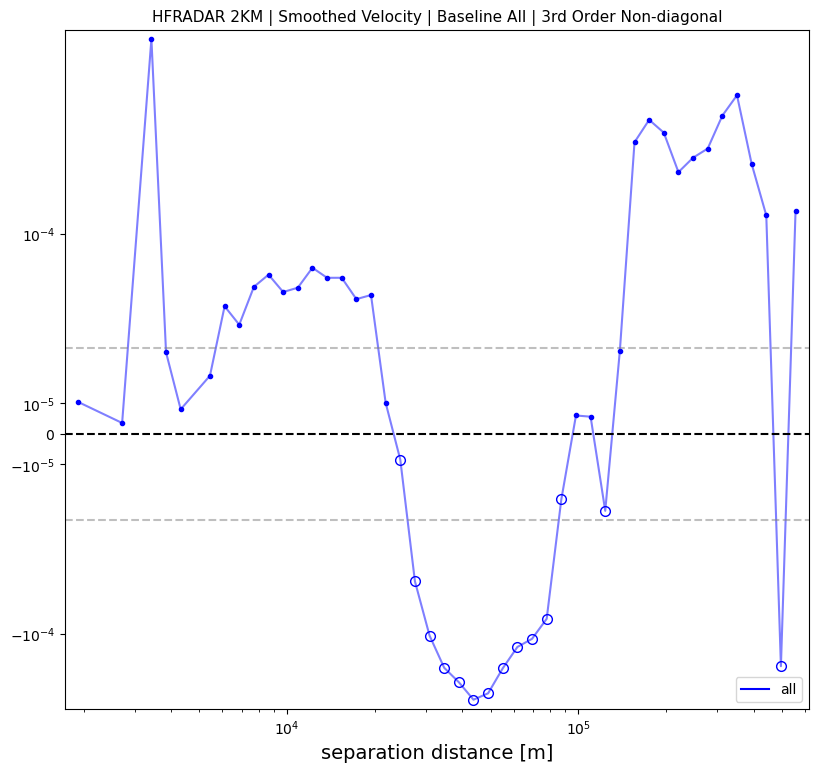

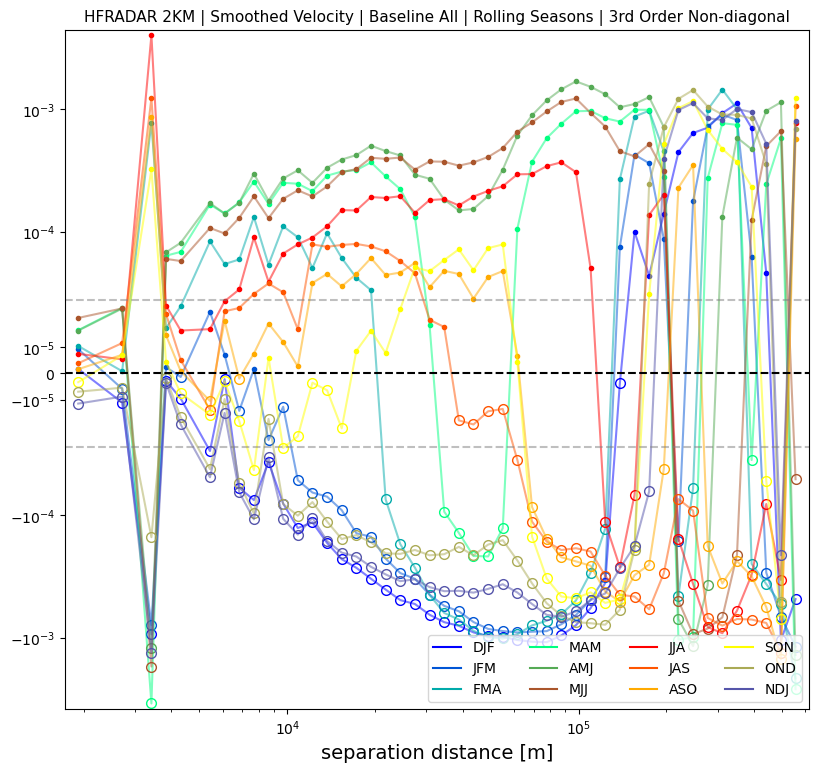

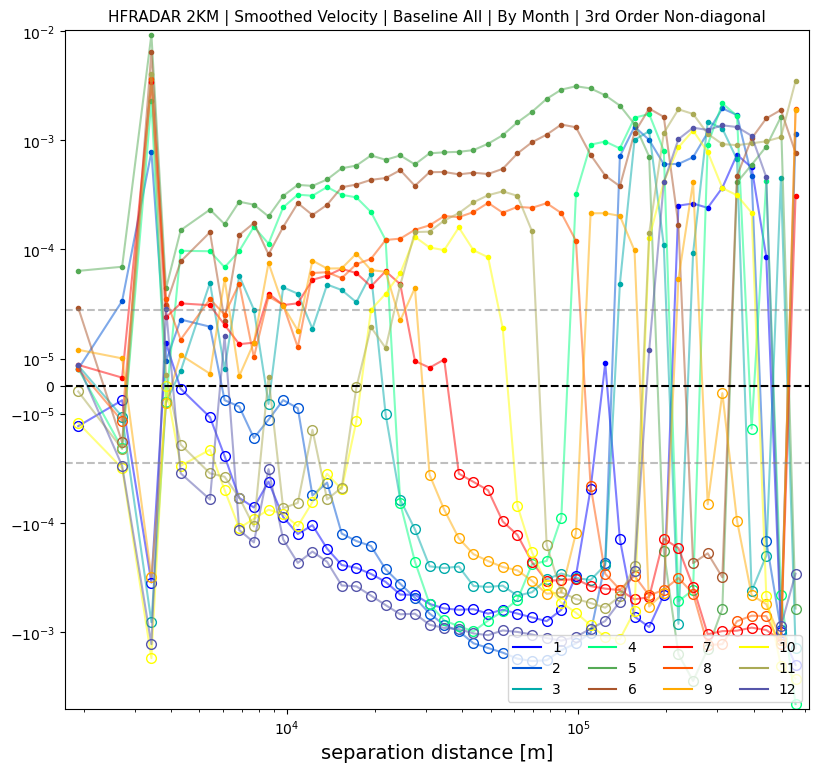

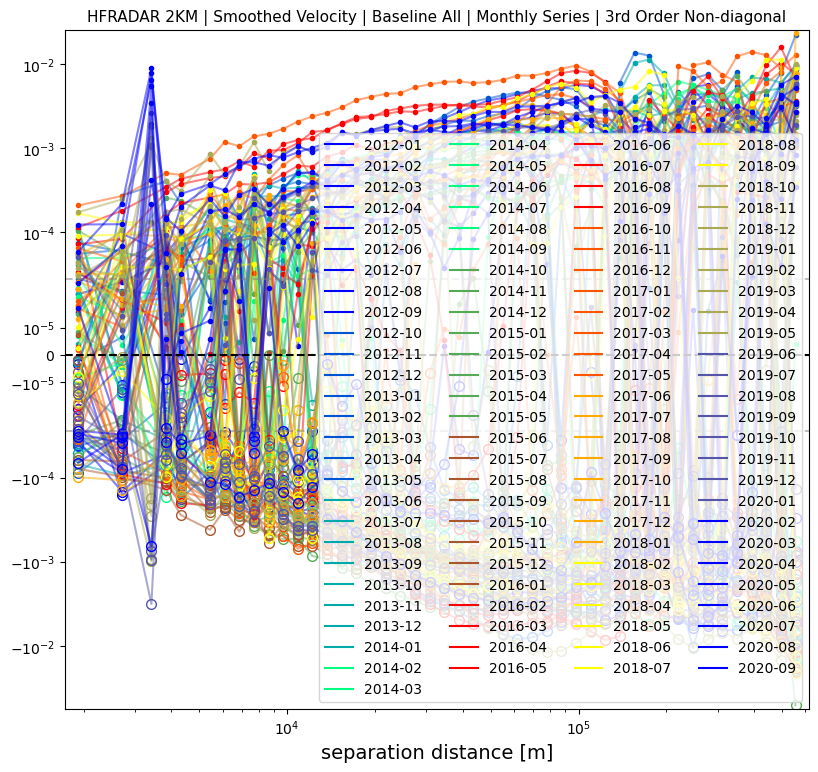

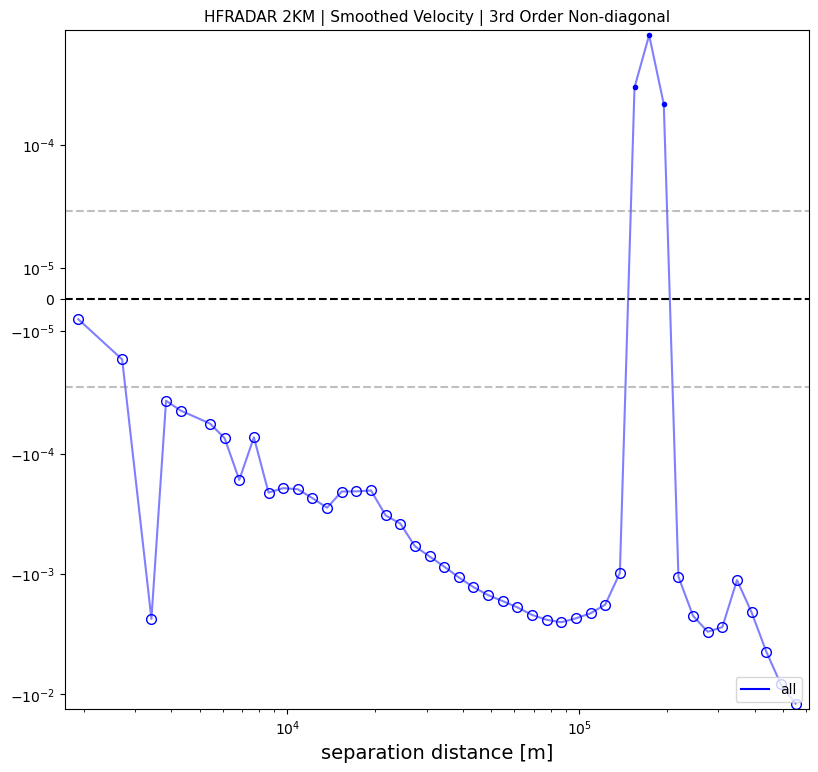

...

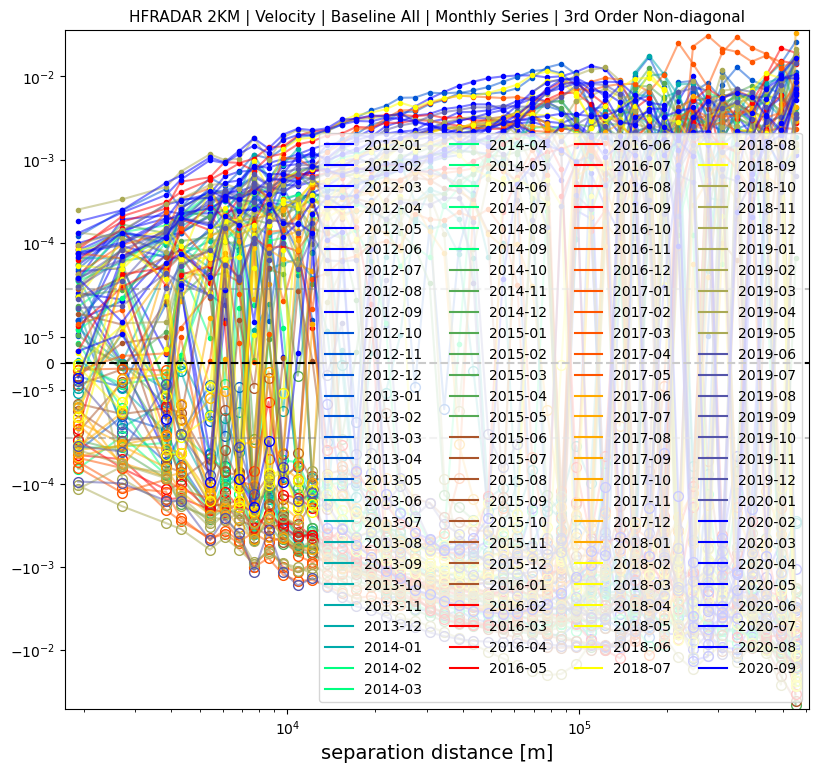

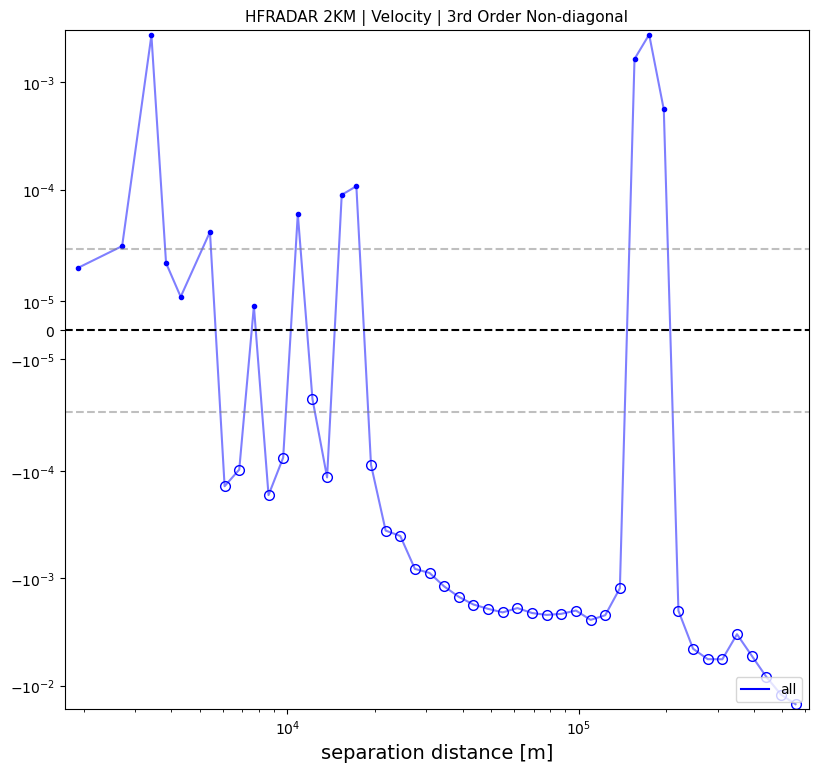

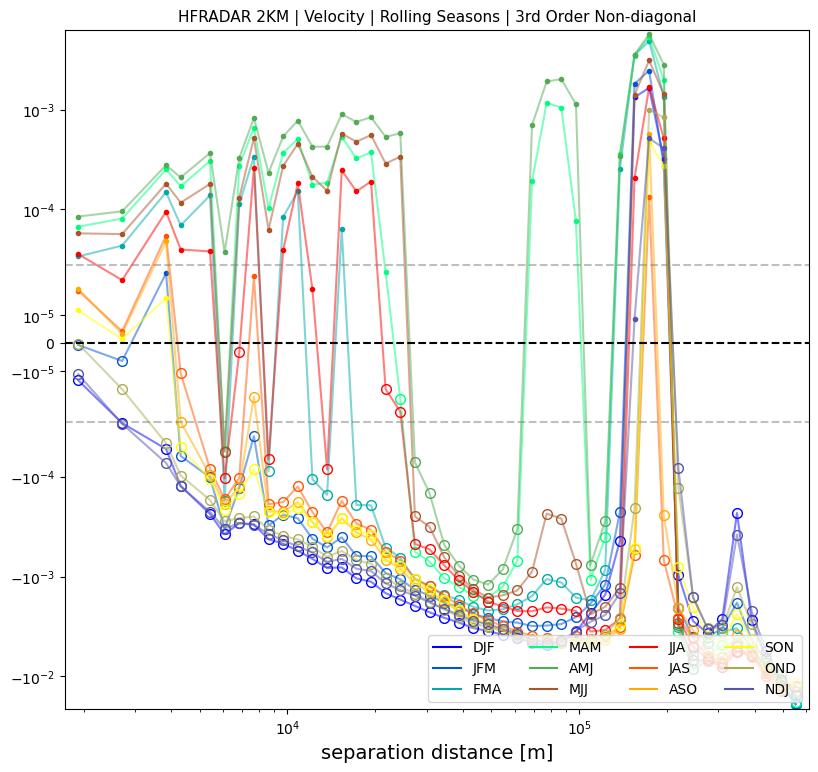

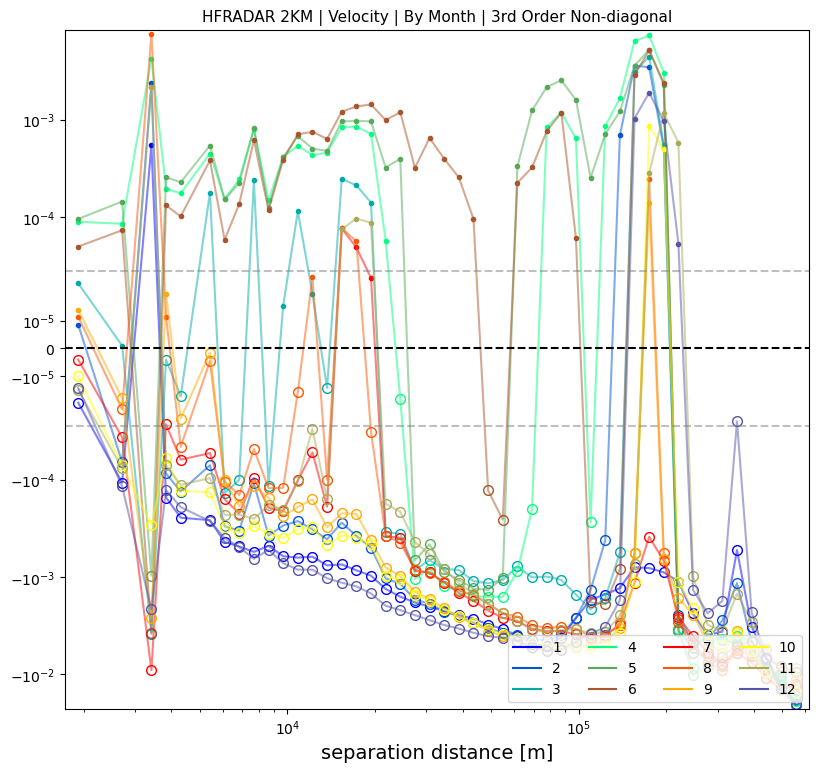

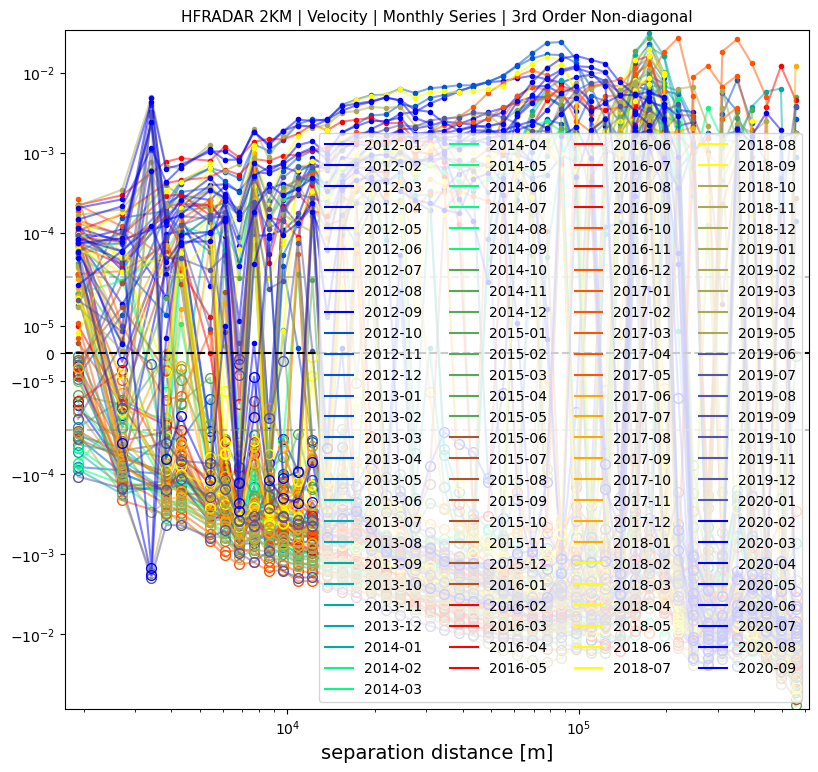

In [33]:
# Run all
reload(personal.SMODE)
reload(personal.calculations)
import re
def convert_to_uppercase(m):
    """Convert the second group to uppercase and join both group 1 & group 2"""
    return m.group(1) + m.group(2).upper()

methods      = ['2nd order', '2nd order longitudinal', '2nd order transverse', '3rd order diagonal', '3rd order non-diagonal']
# methods      = ['2nd order longitudinal', '2nd order transverse', '3rd order diagonal', '3rd order non-diagonal']

smoothings   = ['smoothed', '']
baselines    = ['all', '']
time_groups  = {'all':{'all':slice(0,None,None)}, 'rolling seasons':seas_groups, 'by month':mn_groups, 'monthly series':yrmn_groups}

datas        = {'smoothed':kinetic_energy_smoothed, '':kinetic_energy}
styles       = {'2nd order':'normal', '2nd order longitudinal':'normal', '2nd order transverse':'normal', '3rd order diagonal':'symlog wide', '3rd order non-diagonal':'symlog wide'}
slopes       = {'2nd order':[1,(Fraction(1/3), .1)], '2nd order longitudinal':[1,(Fraction(1/3), .1)], '2nd order transverse':[1,(Fraction(1/3), .1)], '3rd order non-diagonal':[], '3rd order non-diagonal':[]}
                
# HFRADAR_2KM_velocity_smoothed_rolling_seas_third_order_diagonal_sf
for i,(method, smoothing, baseline, time_group) in enumerate(itertools.product(methods, smoothings, baselines, time_groups.keys())): # 5 x (2 x 2 x 4) = 5 x (16) = 80
    if i < 64:
        continue
    print(i)
        
    smoothing_name  = smoothing              + ' '   if len(smoothing) > 0      else '' 
    baseline_name   = 'baseline '+ baseline  + ' | ' if len(baseline)  > 0      else '' 
    time_name       = time_group             + ' | ' if time_group is not 'all' else ''
    
    _name_          = 'HFRADAR 2KM | ' + smoothing_name +  'velocity | ' + baseline_name + time_name +  method 
    _save_name_     = _name_.replace('| ','').replace(' ','_')
    _plot_title_    = re.sub("(^|\s)(\S)", convert_to_uppercase, _name_)
    _save_filepath_ = os.path.normpath(os.path.join(file_path, output_savepath)) + '/' + _save_name_ + '_sf.pkl'
    print('\n' + _plot_title_ + '\n')
    
    recalc        = True
    plot_output   = True
    if recalc:
        print('calculating')
        _data_         = datas[smoothing][['u_p','v_p']].sel(baseline=baseline)
        if time_group  == 'all':
            sel_inds       = np.sort(np.random.choice(np.arange(len(_data_.time)),size=min(20000, len(_data_.time)),replace=False))
        else:
             # sel_inds       = np.arange(len(_data_.time))
            sel_inds       = np.sort(np.random.choice(np.arange(len(_data_.time)),size=min(30000, len(_data_.time)),replace=False))
        _data_         = _data_.isel(time = sel_inds ).compute()
        ch_size_fcn = lambda data: round(2000 * (max(1,50000/data.shape[2]))**1.0) 


        
        KE_rolling_seas_sf          = personal.SMODE.calculate_structure_fcn(
            data                    = _data_,
            precomputed             = {},
            save_variables          = { 'structure_fcn','distance_bins', 'distance_bin_ranges'}, # save items in this dictionary to given filenames
            save_filepath           = _save_filepath_,
            file_path               = os.path.abspath(os.path.dirname('')),
            data_relpath            = "../Data/HF_Radar/2km/processed/smode_region/",
            output_savepath         = "..//Data/HF_Radar/2km/processed/smode_region/miscellaneous/",
            random_subset_size      = 5000,
            time_groups             = {k: (v if not personal.data_structures.isiterable(v) else v[sel_inds]) for k,v in time_groups[time_group].items()}, # how to group the time, can be a list of logical arrays
            nbins                   = 50,
            method_or_order         = method,
            parallelize             = True,
            parallel_args           = {'n_jobs':20, 'require':'sharedmem'},
#             ch_size_fcn             = lambda x: 2000,
            load_after_masking      = False,
            load_at_runtime         = False)
        _ = gc.collect()
        
    if plot_output:
        print('plotting')
        _ = personal.calculations.plot_sturucture_function(personal.IO.pickle_load(_save_filepath_)['structure_fcn'], title=_plot_title_, style=styles[method], slopes=slopes[method], leg1_args={'loc':'lower right' ,'ncol':4,'fontsize':10,'facecolor':'white'},titlesize  = 11,
                                                           leg2_args={'loc':'upper left','ncol':6,'fontsize':10,'facecolor':'white'}, save_path = os.path.normpath(os.path.join(file_path, "../Figures/Structure_Function/"))  + '/' + _save_name_ + '_sf.pdf')

    client.restart()
